# Projeto Final

## Analisando Fluxo de Transito

Todos nós sabemos dos problemas relacionados ao transito de recife. Para identificar o volume de transito tomou como base os dados relacionados a foto sensores.

Dados de Equipament: http://dados.recife.pe.gov.br/dataset/velocidade-das-vias-quantitativo-por-velocidade-media-2020/resource/94c283c0-cbfb-4540-9589-e62cd6ca039a
<p><b>Nome do Arquivo: </b>lombadas-fotossensores.csv</p>

Dados Fluxo de Lombadas: http://dados.recife.pe.gov.br/dataset/velocidade-das-vias-quantitativo-por-velocidade-media-2020/resource/870d90a3-6559-4374-b798-be57a29d3d85
<p><b>Nome do Arquivo: </b>870d90a3-6559-4374-b798-be57a29d3d85.csv</p>

Dados Fluxo de Fotosenssores: http://dados.recife.pe.gov.br/dataset/velocidade-das-vias-quantitativo-por-velocidade-media-2020/resource/7bf5f821-4ec4-47f4-b8ba-c1ab6a1cec3d
<p><b>Nome do Arquivo: </b>57439713-9d98-49b9-a985-e934debf2195.csv</p>

Dados relacionados a Area urbana: http://dados.recife.pe.gov.br/dataset/area-urbana/resource/a642296d-1405-4918-87db-4ce88ba182f5?inner_span=True
<p><b>Nome do Arquivo: </b>trechoslogradouro.csv</p>


In [103]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import numpy as np
#!git clone https://github.com/sauloemp/WebStreetPE.git

## Dados de Equipamentos

In [104]:
dfLobadas = pd.read_csv("Dados/Dados Abertos/lombadas-fotossensores.csv", sep = ";")
dfLobadas.head()

,equipamento,tipo,logradouro,velocidade_via,latitude,longitude
0,5941,Lombada,"AV. MAL. MASCARENHAS DE MORAES, EM FRENTE AERO...",60 km/h,-8.13,-34.92
1,5942,Lombada,"AV. MAL. MASCARENHAS DE MORAES, EM FRENTE AERO...",60 km/h,-8.13,-34.92
2,5943,Lombada,AV. BOA VIAGEM - TERCEIRO JARDIM,60 km/h,-8.11,-34.89
3,5944,Lombada,"DEFRONTE A PCA. GOV. PAULO GUERRA, CABANGA - S...",60 km/h,-8.08,-34.89
4,5945,Lombada,"APOS PONTE AGAMENON MAGALHAES, CABANGA - SENT....",60 km/h,-8.08,-34.89


## Trabalhando Dados de Fluxo Fotosensores

In [105]:
dfFluxoFotosensores = pd.read_csv(r"Dados/Dados Abertos/57439713-9d98-49b9-a985-e934debf2195.csv", sep = ",")
dfFluxoFotosensores.head()

,_id,mes,equipamento,faixa,data,hora,minutos_intervalo,qtd_0a10km,qtd_11a20km,qtd_21a30km,qtd_31a40km,qtd_41a50km,qtd_51a60km,qtd_61a70km,qtd_71a80km,qtd_81a90km,qtd_91a100km,qtd_acimade100km
0,1,12,FS002REC,1,2020-12-01T00:00:00,1,0-15,1,1,0,0,0,0,0,0,0,0,0
1,2,12,FS002REC,1,2020-12-01T00:00:00,1,31-45,1,0,0,0,0,0,0,0,0,0,0
2,3,12,FS002REC,1,2020-12-01T00:00:00,1,46-59,0,2,1,0,0,0,0,0,0,0,0
3,4,12,FS002REC,1,2020-12-01T00:00:00,2,16-30,0,0,1,1,0,0,0,0,0,0,0
4,5,12,FS002REC,1,2020-12-01T00:00:00,2,46-59,2,1,0,0,0,0,0,0,0,0,0


In [106]:
dfFluxoFotosensores['equipamento'].unique()

array(['FS002REC', 'FS003REC', 'FS004REC', 'FS006REC', 'FS009REC',
       'FS010REC', 'FS012REC', 'FS014REC', 'FS018REC', 'FS020REC',
       'FS021REC', 'FS022REC', 'FS023REC', 'FS024REC', 'FS025REC',
       'FS026REC', 'FS027REC', 'FS028REC', 'FS029REC', 'FS030REC',
       'FS033REC', 'FS037REC'], dtype=object)

In [107]:
dfFluxoFotosensores.iloc[:,7:].sum(axis=1)

0          2
1          1
2          3
3          2
4          3
          ..
152253    12
152254     6
152255     1
152256     6
152257     3
Length: 152258, dtype: int64

In [108]:
dfFotossensoresBase = dfFluxoFotosensores.iloc[:,:7]
dfFotossensoresSomatorio = dfFluxoFotosensores.iloc[:,7:].sum(axis=1)
dfFotossensoresBase['Fluxo'] = dfFotossensoresSomatorio
dfFotossensoresBase.head()

,_id,mes,equipamento,faixa,data,hora,minutos_intervalo,Fluxo
0,1,12,FS002REC,1,2020-12-01T00:00:00,1,0-15,2
1,2,12,FS002REC,1,2020-12-01T00:00:00,1,31-45,1
2,3,12,FS002REC,1,2020-12-01T00:00:00,1,46-59,3
3,4,12,FS002REC,1,2020-12-01T00:00:00,2,16-30,2
4,5,12,FS002REC,1,2020-12-01T00:00:00,2,46-59,3


In [109]:
dfFotossensoresBase.drop(columns=['_id','faixa','mes', 'minutos_intervalo','hora','data'], inplace= True)

# Dados Relacionados A Lombada Eletronica

In [110]:
dfFluxoLombadaEletro = pd.read_csv(r"Dados/Dados Abertos/870d90a3-6559-4374-b798-be57a29d3d85.csv", sep = ",")
dfFluxoLombadaEletro.head()

,_id,ano,mes,equipamento,faixa,data,hora,minutos_intervalo,qtd_0a10km,qtd_11a20km,qtd_21a30km,qtd_31a40km,qtd_41a50km,qtd_51a60km,qtd_61a70km,qtd_71a80km,qtd_81a90km,qtd_91a100km,qtd_acimade100km
0,1,2020,12,5941.00,1.00,2020-12-01T00:00:00,0.00,00:00-00:15,0.00,0.00,0.00,0.00,11.00,4.00,2.00,1.00,0.00,1.00,0.00
1,2,2020,12,5941.00,1.00,2020-12-01T00:00:00,0.00,00:15-00:30,0.00,0.00,0.00,2.00,5.00,10.00,0.00,1.00,0.00,1.00,0.00
2,3,2020,12,5941.00,1.00,2020-12-01T00:00:00,0.00,00:30-00:45,0.00,0.00,0.00,1.00,8.00,3.00,3.00,0.00,0.00,0.00,0.00
3,4,2020,12,5941.00,1.00,2020-12-01T00:00:00,0.00,00:45-01:00,0.00,0.00,1.00,0.00,5.00,2.00,0.00,0.00,0.00,0.00,0.00
4,5,2020,12,5941.00,1.00,2020-12-01T00:00:00,10.00,10:00-10:15,0.00,0.00,7.00,28.00,121.00,26.00,1.00,0.00,0.00,0.00,0.00


In [111]:
dfFluxoLombadaEletro.iloc[:,8:].sum(axis=1)

0         19.00
1         19.00
2         15.00
3          8.00
4        183.00
          ...  
165075    78.00
165076    95.00
165077   100.00
165078    96.00
165079     0.00
Length: 165080, dtype: float64

In [112]:
dfLombEletBase = dfFluxoLombadaEletro.iloc[:,:7]
dfLombEletSomatorio = dfFluxoLombadaEletro.iloc[:,7:].sum(axis=1)
dfLombEletBase['Fluxo'] = dfLombEletSomatorio
dfLombEletBase.head()

,_id,ano,mes,equipamento,faixa,data,hora,Fluxo
0,1,2020,12,5941.00,1.00,2020-12-01T00:00:00,0.00,19.00
1,2,2020,12,5941.00,1.00,2020-12-01T00:00:00,0.00,19.00
2,3,2020,12,5941.00,1.00,2020-12-01T00:00:00,0.00,15.00
3,4,2020,12,5941.00,1.00,2020-12-01T00:00:00,0.00,8.00
4,5,2020,12,5941.00,1.00,2020-12-01T00:00:00,10.00,183.00


In [113]:
dfLombEletBase.drop(columns=['_id','ano','mes', 'faixa','hora','data'], inplace= True)

In [114]:
dfLombEletBase = dfLombEletBase.groupby(["equipamento"]).sum("Fluxo")

# União de dados de Fotosensores e Lombada Eletronica

In [115]:
dfLombEletBase

,Fluxo
equipamento,
5941.00,931074.00
5942.00,921182.00
5943.00,74554.00
5944.00,736872.00
5945.00,1014432.00
5946.00,540866.00
5947.00,234441.00
5948.00,719832.00
5949.00,358495.00


In [116]:
dfFotossensoresBase

,equipamento,Fluxo
0,FS002REC,2
1,FS002REC,1
2,FS002REC,3
3,FS002REC,2
4,FS002REC,3
...,...,...
152253,FS037REC,12
152254,FS037REC,6
152255,FS037REC,1
152256,FS037REC,6


In [117]:
dfFotossensoresBase = dfFotossensoresBase.groupby(by=['equipamento']).sum('Fluxo').reset_index()
dfLombEletBase = dfLombEletBase.groupby(by=['equipamento']).sum('Fluxo').reset_index()

In [118]:
#Limpando Dados dos Fotosensores
dfFotossensoresBase['codFotoSensor'] = dfFotossensoresBase['equipamento'].str.split("REC", expand=False)
dfFotossensoresBase['codFotoSensor'] = dfFotossensoresBase['equipamento'].str.split("REC", expand=True)

In [119]:
#Limpando Dados dos Lombada Eletronica
#Limpando Dados das Lombadas
dfLombEletBase["equipamento"] = dfLombEletBase["equipamento"].astype(str)

dfLombEletBase['codFotoSensor'] = dfLombEletBase["equipamento"].str.split(".").str[0]

In [120]:
dfConcat = pd.concat([dfLombEletBase, dfFotossensoresBase])
dfMergeSensorEquip = pd.merge(dfConcat,dfLobadas, left_on='codFotoSensor',right_on='equipamento')

In [121]:
dfMergeSensorEquip.sort_values('Fluxo',inplace=True)

In [122]:
dfMergeSensorEquip.reset_index(drop=True)

,equipamento_x,Fluxo,codFotoSensor,equipamento_y,tipo,logradouro,velocidade_via,latitude,longitude
0,FS018REC,30677.00,FS018,FS018,Fotossensor,"AV. DEZESSETE DE AGOSTO, SEMAFORO 370.",60 Km/h,-8.03,-34.93
1,FS003REC,43147.00,FS003,FS003,Fotossensor,"AV. MARQUES DE OLINDA, SEMAFORO 020.",30 Km/h,-8.06,-34.87
2,5943.0,74554.00,5943,5943,Lombada,AV. BOA VIAGEM - TERCEIRO JARDIM,60 km/h,-8.11,-34.89
3,FS009REC,97590.00,FS009,FS009,Fotossensor,"AV. CDE. DA BOA VISTA, SEMAFORO 486.",40 Km/h,-8.06,-34.88
4,FS030REC,114229.00,FS030,FS030,Fotossensor,"AV. LIBERDADE, SEMAFORO 440",50 Km/h,-8.08,-34.97
5,FS024REC,137425.00,FS024,FS024,Fotossensor,"RUA GUILHERME PINTO, SEMAFORO 432.",40 Km/h,-8.05,-34.90
6,FS002REC,184834.00,FS002,FS002,Fotossensor,"RUA MADRE DE DEUS, SEMAFORO 020.",30 Km/h,-8.06,-34.87
7,5957.0,197008.00,5957,5957,Lombada,"AV. CONS. AGUIAR, N. 4620",60 km/h,-8.13,-34.90
8,FS025REC,201263.00,FS025,FS025,Fotossensor,"AV. DESEMBARGADOR JOSÉ NEVES, SEMAFORO 580",50 Km/h,-8.12,-34.91
9,FS029REC,232432.00,FS029,FS029,Fotossensor,RUA FALCAO DE LACERDA SEMAFORO 285,50 Km/h,-8.09,-34.96


In [123]:
dfMergeSensorEquip['tipo'].value_counts()

Lombada        32
Fotossensor    22
Name: tipo, dtype: int64

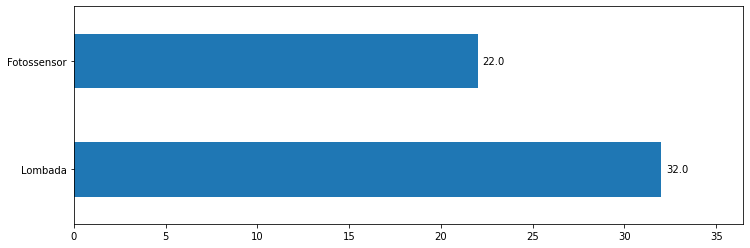

In [124]:
# Bring some raw data.
frequencies = dfMergeSensorEquip['tipo'].value_counts()

freq_series = pd.Series(frequencies)

y_labels = dfMergeSensorEquip['tipo'].value_counts().index

# Plot the figure.
plt.figure(figsize=(12, 4))
ax = freq_series.plot(kind='barh')
#ax.set_title('Quantidade Total de Sensores')
#ax.set_xlabel('Quantidade de Sensores')
#ax.set_ylabel('Sensores')
ax.set_yticklabels(y_labels)

rects = ax.patches

# For each bar: Place a label
for rect in rects:
    # Get X and Y placement of label from rect.
    x_value = rect.get_width()
    y_value = rect.get_y() + rect.get_height() / 2

    # Number of points between bar and label. Change to your liking.
    space = 5
    # Vertical alignment for positive values
    ha = 'left'

    # If value of bar is negative: Place label left of bar
    if x_value < 0:
        # Invert space to place label to the left
        space *= -1
        # Horizontally align label at right
        ha = 'right'

    # Use X value as label and format number with one decimal place
    label = "{:.1f}".format(x_value)

    # Create annotation
    plt.annotate(
        label,                      # Use `label` as label
        (x_value, y_value),         # Place label at end of the bar
        xytext=(space, 0),          # Horizontally shift label by `space`
        textcoords="offset points", # Interpret `xytext` as offset in points
        va='center',                # Vertically center label
        ha=ha)                      # Horizontally align label differently for
                                    # positive and negative values.
plt.margins(0.14)

In [125]:
t = sum(dfMergeSensorEquip["Fluxo"])
print(sum(dfMergeSensorEquip["Fluxo"].reset_index(drop=True)/t))

1.0


# Coletando Endereços

In [126]:
for index, row in dfMergeSensorEquip.iterrows():
  print(row["latitude"], row["longitude"])

-8.0277621 -34.928001
-8.0635787 -34.873533
-8.1078431 -34.8881609
-8.061165 -34.8832943
-8.0811109 -34.9683544
-8.05216 -34.90217
-8.0634002 -34.8736694
-8.127873 -34.900242
-8.1215132 -34.9093425
-8.0920388 -34.9614941
-8.1410665 -34.9032775
-8.08463 -34.92803
-8.032786 -34.902984
-8.0874203 -34.9099345
-8.0278685 -34.8929091
-8.1362834 -34.9035808
-8.1362834 -34.9035808
-8.0431659 -34.8858642
-8.1214297 -34.9098383
-8.0182744 -34.9283043
-8.0395243 -34.9576449
-8.1029992 -34.91313
-8.0758569 -34.8874512
-8.0795908 -34.8927989
-8.1157038 -34.904305
-8.0883266 -34.8837708
-8.0637868 -34.8716323
-8.116378 -34.904458
-8.0391921 -34.9298387
-8.0674689 -34.9278105
-8.0411575 -34.9033434
-8.1410665 -34.9032775
-8.05538 -34.90906
-8.062406 -34.917518
-8.0626244 -34.8973606
-8.012909 -34.88938
-8.011664 -34.889419
-8.0919008 -34.8820881
-8.1057941 -34.8920917
-8.0989628 -34.8902929
-8.0431659 -34.8858642
-8.0717339 -34.8779064
-8.06242 -34.91688
-8.0801208 -34.8921866
-8.1053608 -34.8918783


In [127]:
dfMergeSensorEquip["latitude"][0]

-8.1309702

In [128]:
from geopy.geocoders import Nominatim

In [141]:
listEnd = []

for index, row in dfMergeSensorEquip.iterrows():
    Neighbor = Nominatim(user_agent="Intro Geocode").reverse(str(row["latitude"]) + ", " + str(row["longitude"]))[0]
    listEnd.append(Neighbor) 
    print(Neighbor, '\n')

GeocoderServiceError: Non-successful status code 502

In [130]:
Bairros = ["Monteiro" ,"Bairro do Recife" ,"Boa Viagem" ,"Boa Vista"
           ,"Totó","Graças","Bairro do Recife","Boa Viagem","Imbiribeira"
           ,"Tejipió","Boa Viagem","Jiquiá","Tamarineira","Imbiribeira"
           ,"Beberibe","Boa Viagem","Boa Viagem","Boa Vista","Imbiribeira"
           ,"Macaxeira","Várzea","Imbiribeira","São José","Cabanga"
           ,"Boa Viagem","Pina","Bairro do Recife","Boa Viagem","Iputinga"
           ,"San Martim","Graças","Boa viagem","Sítio do Berardo","Prado"
           ,"Paissandu","Beberibe","Fundão","Pina","Pina","Pina","Vila Rua Berlim"
           ,"São José","Prado","Cabanga","Pina","Torre","Boa Viagem","Ibura"
           ,"Pina","Paissandu","Cabanga","Boa Vista","Boa Viagem","Vila Campo da Vila"]
dfMergeSensorEquip["Bairros"] = Bairros
dfMergeSensorEquip["Ruas"] = listEnd

ValueError: Length of values (0) does not match length of index (54)

In [131]:
dfMergeSensorEquip.query("Bairros in ('Boa Viagem')")

,equipamento_x,Fluxo,codFotoSensor,equipamento_y,tipo,logradouro,velocidade_via,latitude,longitude,Bairros
2,5943.0,74554.00,5943,5943,Lombada,AV. BOA VIAGEM - TERCEIRO JARDIM,60 km/h,-8.11,-34.89,Boa Viagem
16,5957.0,197008.00,5957,5957,Lombada,"AV. CONS. AGUIAR, N. 4620",60 km/h,-8.13,-34.90,Boa Viagem
6,5947.0,234441.00,5947,5947,Lombada,AV. BOA VIAGEM – EM FRENTE PARQUE DONA LINDU,60 km/h,-8.14,-34.90,Boa Viagem
49,FS028REC,316873.00,FS028,FS028,Fotossensor,"RUA VISCONDE DE JEQUITINHONHA,SEMAFORO 158",60 Km/h,-8.14,-34.90,Boa Viagem
48,FS027REC,353756.00,FS027,FS027,Fotossensor,"RUA VISCONDE DE JEQUITINHONHA,SEMAFORO 158",60 Km/h,-8.14,-34.90,Boa Viagem
21,5962.0,446339.00,5962,5962,Lombada,"AV. DOM JOAO VI, EM FRT. AO PT. DE ONIBUS N. 0...",50 km/h,-8.12,-34.90,Boa Viagem
27,5968.0,495262.00,5968,5968,Lombada,"AV. DOM JOAO VI, ENTRE OS N. 777 E 835 - SENT....",50 km/h,-8.12,-34.90,Boa Viagem
1,5942.0,921182.00,5942,5942,Lombada,"AV. MAL. MASCARENHAS DE MORAES, EM FRENTE AERO...",60 km/h,-8.13,-34.92,Boa Viagem
35,FS006REC,1122759.00,FS006,FS006,Fotossensor,"AV. ENG. DOMINGOS FERREIRA, SEMAFORO 297.",60 Km/h,-8.11,-34.89,Boa Viagem


In [30]:
dfMergeSensorEquip[["Bairros","codFotoSensor","tipo","Ruas"]].query("Bairros in ('Boa Viagem', 'Cabanga','Paissandu','Pina','Boa Vista')").sort_values('Bairros').to_excel('Ruas_c.xlsx', encoding='utf8')
dfMergeSensorEquip[["Bairros","codFotoSensor","tipo","Ruas"]].query("Bairros in ('Monteiro', 'Jiquiá','Tamarineira','Totó','Tejipió')").sort_values('Bairros').to_excel('Ruas_b.xlsx', encoding='utf8')

# Trabalhando Visualizações

In [31]:
dfBairro = dfMergeSensorEquip[['Bairros','Fluxo']].groupby('Bairros').sum('Fluxo').reset_index().sort_values('Fluxo')
dfBairro.head()

,Bairros,Fluxo
13,Monteiro,30677.0
23,Totó,114229.0
21,Tejipió,232432.0
11,Jiquiá,271431.0
20,Tamarineira,279190.0


In [32]:
dfBairro["Fluxo"]

13      30677.0
23     114229.0
21     232432.0
11     271431.0
20     279190.0
12     383498.0
26     385460.0
10     506259.0
17     511543.0
4      540866.0
19     546127.0
6      635166.0
7      674001.0
0      702892.0
25     719832.0
22     914697.0
1      917021.0
8      931074.0
18    1139607.0
24    1229216.0
9     1278910.0
16    1312036.0
3     1534136.0
14    1583796.0
5     2178439.0
2     4162174.0
15    4374506.0
Name: Fluxo, dtype: float64

In [33]:
dfBairro.query("Bairros in ('Pina','Boa Viagem')")["Fluxo"].sum()

8536680.0

In [34]:
T = sum(dfBairro["Fluxo"])
dfBairro.query("Bairros in ('Pina','Boa Viagem')")["Fluxo"].sum()/T*100

30.391308550274545

In [35]:
pd.options.display.float_format = "{:.2f}".format
dfBairro.describe()

,Fluxo
count,27.00
mean,1040341.30
std,1057035.15
min,30677.00
25%,445859.50
50%,702892.00
75%,1254063.00
max,4374506.00


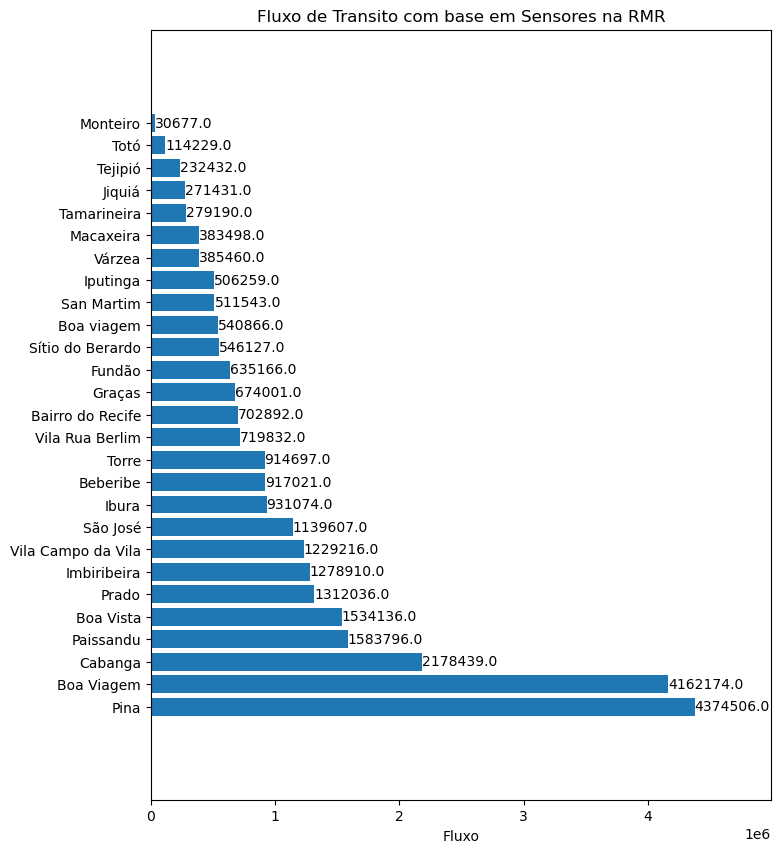

In [36]:

plt.rcdefaults()
fig, ax = plt.subplots(figsize = (8,10))


Bairro = dfBairro["Bairros"]
y_pos = np.arange(len(Bairro))      
performance = dfBairro["Fluxo"]

bars = ax.barh(y_pos, performance)
for bar in bars:
  width = bar.get_width() #Previously we got the height
  label_y_pos = bar.get_y() + bar.get_height() / 2
  ax.text(width+2, label_y_pos, s=f'{width}', va='center')

ax.set_yticks(y_pos)
ax.set_yticklabels(Bairro)
ax.invert_yaxis()  # labels read top-to-bottom


ax.set_xlabel('Fluxo')
ax.set_title('Fluxo de Transito com base em Sensores na RMR')


plt.margins(0.14)
plt.show();

No handles with labels found to put in legend.


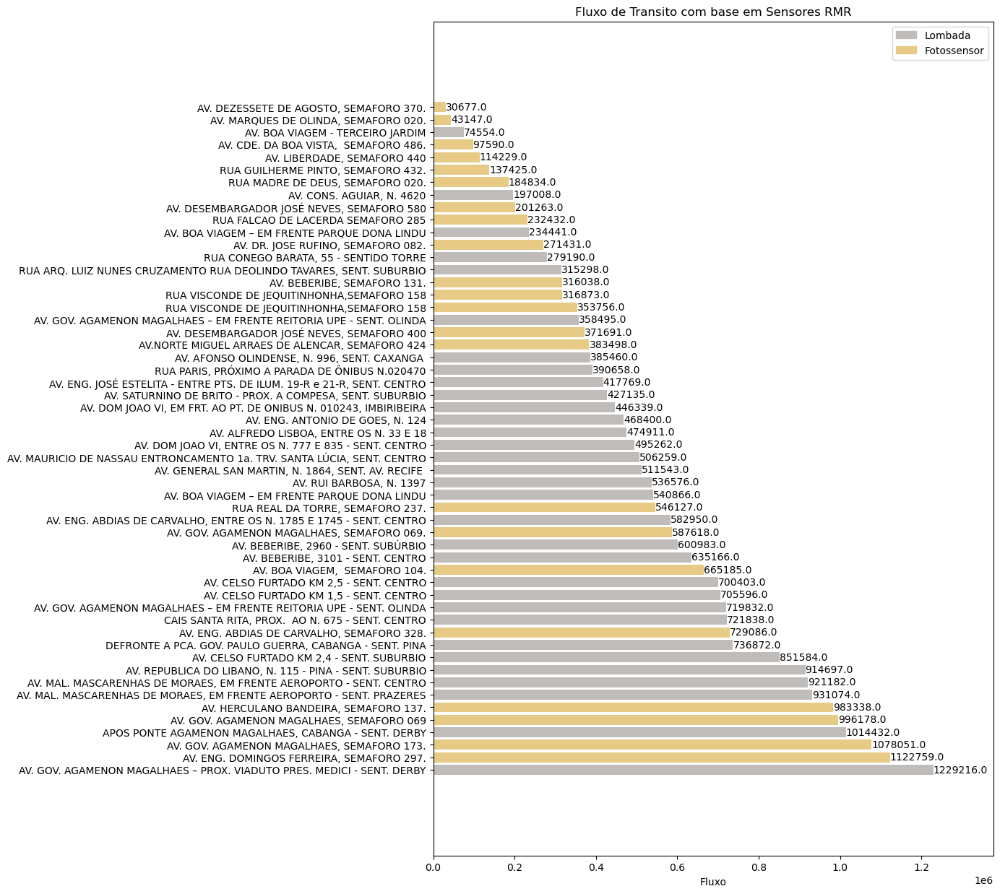

In [37]:
#Visualização de ruas
plt.rcdefaults()
fig, ax = plt.subplots(figsize = (10,15))


Bairro = dfMergeSensorEquip["logradouro"]
y_pos = np.arange(len(Bairro))
performance = dfMergeSensorEquip["Fluxo"]
colors = {"Lombada":"#C0BCB9", "Fotossensor":"#e6ca86"}         
c = dfMergeSensorEquip['tipo'].apply(lambda x: colors[x])
labels = list(colors.keys())
handles = [plt.Rectangle((0,0),1,1, color=colors[label]) for label in labels]




bars = ax.barh(y_pos, performance, align='center', color=c, linewidth = 6)
for bar in bars:
  width = bar.get_width() #Previously we got the height
  label_y_pos = bar.get_y() + bar.get_height() / 2
  ax.text(width+2, label_y_pos, s=f'{width}', va='center')

ax.set_yticks(y_pos)
ax.set_yticklabels(Bairro)
ax.invert_yaxis()  # labels read top-to-bottom
ax.legend()

ax.set_xlabel('Fluxo')
ax.set_title('Fluxo de Transito com base em Sensores RMR')


plt.legend(handles, labels)
plt.margins(0.12)
plt.show();

No handles with labels found to put in legend.


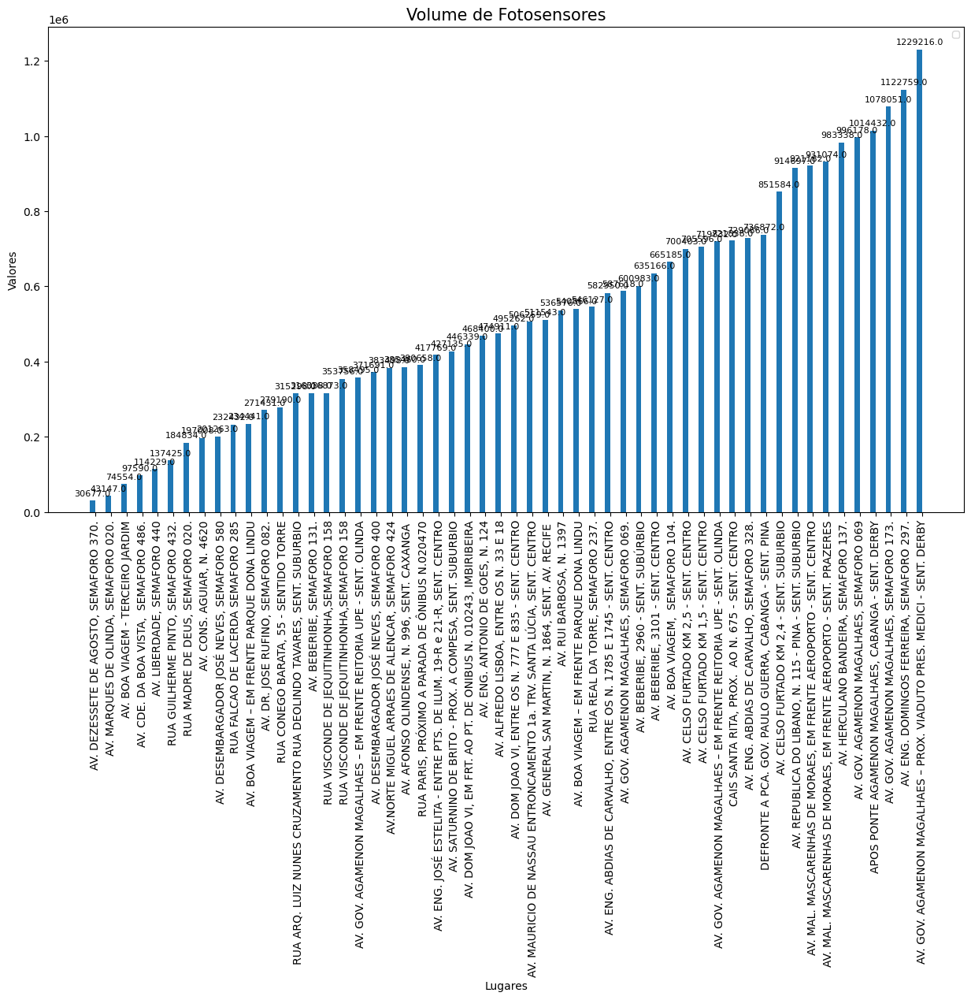

In [38]:
# Parâmetros iniciais

rotulos = dfMergeSensorEquip['logradouro']
x = np.arange(len(rotulos))
width = 0.35 # distanciamento das barras

fig, ax = plt.subplots(figsize=(15, 8))

# gerando dados para gráfico de barras

movie_bar = ax.bar(x - width/2, dfMergeSensorEquip['Fluxo'], width)

# definindo o nome dos eixos e Título

ax.set_xlabel('Lugares')
ax.set_ylabel('Valores')
ax.set_title('Volume de Fotosensores', fontsize = 15)
ax.set_xticks(x)
plt.xticks(rotation = 90) # Rotaciona os rótulos do eixo x em 90o.
ax.set_xticklabels(rotulos)

plt.rcParams.update({'font.size': 8})

# adicionando legenda

ax.legend()

def get_label(qtds):
    for i in qtds:
        altura = i.get_height()
        ax.annotate('{}'.format(altura,), xy=(i.get_x()+ i.get_width()/2, altura),
                xytext=(0,3),
                textcoords="offset points",
                ha='center', va='bottom')

  
get_label(movie_bar)

## Trabalhando Dados de Trecho

In [40]:
dfTrecho = pd.read_csv(r"Dados/Dados Abertos/trechoslogradouro.csv", sep = ";")
dfTrecho.head()

,codlogradouro,nome_logradouro_concatenado,nome_oficial_logradouro,nome_logradouro_resumido,cod_indica_pavimentacao,desc_indica_pavimentacao,indica_corredor_transporte,indica_perimetral,codbairro,nomeBairro
0,6939,RUA ARACATUBA,Rua Araçatuba,R. Aracatuba,S,Via Pavimentada,NaN,NaN,213,IPSEP
1,6947,RUA ARACE,Rua Arace,R. Arace,S,Via Pavimentada,NaN,NaN,566,NOVA DESCOBERTA
2,6955,RUA ARACOIABA,Rua Araçoiaba,R. Aracoiaba,X,Não definida,NaN,NaN,892,TEJIPIO
3,10502,RUA BEATRIZ,Rua Beatriz,R. Beatriz,S,Via Pavimentada,NaN,NaN,337,AGUA FRIA
4,10510,RUA BEBEDOURO,Rua Bebedouro,R. Bebedouro,S,Via Pavimentada,NaN,NaN,523,ALTO JOSE DO PINHO


In [41]:
dfTrecho[["nomeBairro",'nome_logradouro_resumido']]

,nomeBairro,nome_logradouro_resumido
0,IPSEP,R. Aracatuba
1,NOVA DESCOBERTA,R. Arace
2,TEJIPIO,R. Aracoiaba
3,AGUA FRIA,R. Beatriz
4,ALTO JOSE DO PINHO,R. Bebedouro
...,...,...
11916,IBURA,R. Lourival Bandeira de Melo
11917,IBURA,R. José Durval Carneiro
11918,IBURA,R. Dr Achilles Amorim Moura
11919,IBURA,R. Reinaldo Dorneles Camara


## Trabalhando com Grafos

In [42]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import numpy as np
import networkx as nx

#Minhas funções
def grauMedio(G):
    i = 0
    vetorDeGraus = np.zeros(G.order())
    for no in G.degree():
        vetorDeGraus[i] = no[1]
        i += 1
    grauMedio = np.mean(vetorDeGraus)
    return grauMedio

def entropia(G):
    entropia = 0
    freq = nx.degree_histogram(G)
    for i in range(len(freq)):
        if freq[i] != 0: 
            entropia = entropia - freq[i]*np.log2(freq[i])
    return entropia

In [43]:
G = nx.Graph()

#G = nx.Graph([("R. Cláudio Brotherhood","Rua Áureo Xavier"),("R. Cláudio Brotherhood","R. Euríco de Souza Leão")])
G = nx.Graph([("R. Cláudio Brotherhood","Rua Áureo Xavier")])
G.edges()
#nx.draw_networkx(G)
#plt.show()

EdgeView([('R. Cláudio Brotherhood', 'Rua Áureo Xavier')])

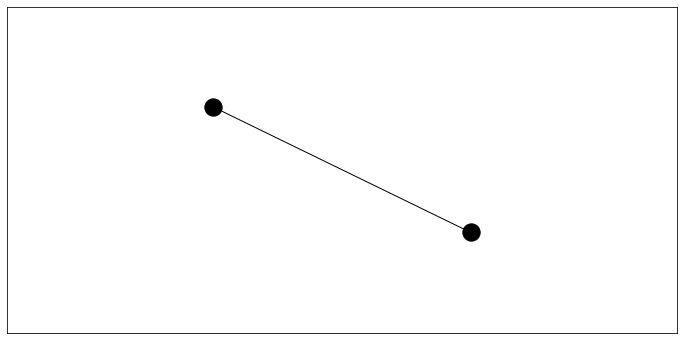

In [44]:
def nudge(pos, x_shift, y_shift):
    return {n:(x + x_shift, y + y_shift) for n,(x,y) in pos.items()}


#G = nx.Graph()

#G = nx.Graph([("R. Cláudio Brotherhood","Rua Áureo Xavier"),("R. Cláudio Brotherhood","R. Euríco de Souza Leão")])
G = nx.Graph([("R. Cláudio Brotherhood","R. Áureo Xavier"), ("R. Áureo Xavier", "R. Cláudio Brotherhood")])

fig, ax = plt.subplots(1,1,figsize=(12,6))
pos = nx.spring_layout(G)
pos_nodes = nudge(pos, 0, 0.1)

#nx.draw_networkx(G,with_labels=True, pos = pos_nodes, node_size=350, node_color='Black' ,ax=ax[0])

nx.draw_networkx(G, pos=pos, with_labels=False, ax=ax, node_color='Black')
nx.draw_networkx_labels(G, pos=pos_nodes, ax=ax)

ax.margins(0.8, 0.8) 
plt.show()

In [45]:
def nudge(pos, x_shift, y_shift):
    return {n:(x + x_shift, y + y_shift) for n,(x,y) in pos.items()}


def plotIndicadoresGrafos(G):
    print('\n\n'+'\033[1m' + 'Indicadores' + '\033[0m')
    print('Densidade: \t\t', nx.density(G))
    print("Coef. Clusterização: \t", nx.average_clustering(G))
    print("Grau médio: \t\t", grauMedio(G))
    print("Entropia: \t\t", entropia(G))
    print("Assortatividade: \t", nx.degree_assortativity_coefficient(G))

    print('\n\033[1m' + 'Graficos' + '\033[0m')
    #Autovalores
    autovalores = nx.laplacian_spectrum(G)
    plt.bar(np.arange(G.order()), autovalores)
    plt.title("Autovalores")
    plt.show()

    #Disrtibuição
    freq = nx.degree_histogram(G)
    plt.title("Distribuição")
    plt.bar(np.arange(len(freq)), freq)
    plt.show()

    #Grafos
    
    fig, ax = plt.subplots(1,1,figsize=(12,6))
    pos = nx.spring_layout(G)
    pos_nodes = nudge(pos, 0, 0.1)

    nx.draw_networkx(G, pos=pos, with_labels=False, ax=ax, node_color='Black')
    nx.draw_networkx_labels(G, pos=pos_nodes, ax=ax)
    ax.margins(0.8, 0.8)

    plt.title("Grafo")

    plt.show()



Indicadores
Densidade: 		 1.0
Coef. Clusterização: 	 0.0
Grau médio: 		 1.0
Entropia: 		 -2.0
Assortatividade: 	 nan

Graficos


D:\ProgramData\Anaconda3\lib\site-packages\networkx\algorithms\assortativity\correlation.py:287: RuntimeWarning: invalid value encountered in double_scalars
  return (xy * (M - ab)).sum() / numpy.sqrt(vara * varb)


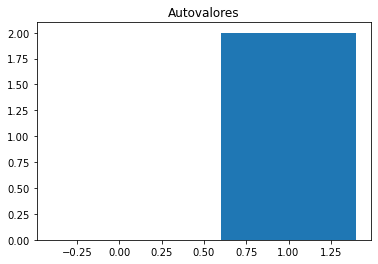

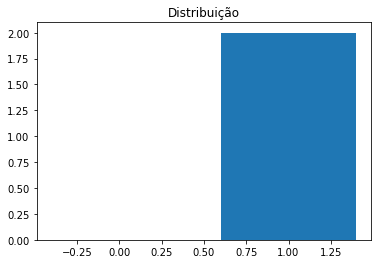

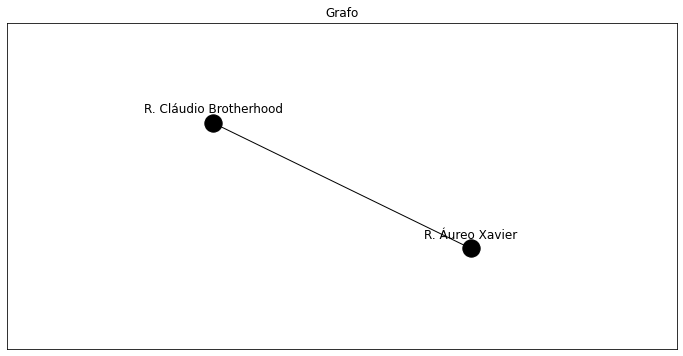

In [46]:
plotIndicadoresGrafos(G)

## Coletar dados de ruas

In [ ]:
import pandas as pd
listDf = []
qtdPage = 2

for i in range(qtdPage):
    df = pd.read_html("https://cep.guiamais.com.br/busca/toto-recife-pe?page={}".format(i+1), encoding='utf8')
    listDf.append(df[0])

dfConcat = pd.concat(listDf)

dfConcat = dfConcat.query("BAIRRO =='Totó'")

dfConcat.to_excel("Bairro_Toto.xlsx")

In [ ]:
len(dfConcat)

In [78]:
def nudge(pos, x_shift, y_shift):
    return {n:(x + x_shift, y + y_shift) for n,(x,y) in pos.items()}


#Minhas funções
def grauMedio(G):
    i = 0
    vetorDeGraus = np.zeros(G.order())
    for no in G.degree():
        vetorDeGraus[i] = no[1]
        i += 1
    grauMedio = np.mean(vetorDeGraus)
    return grauMedio

def entropia(G):
    entropia = 0
    freq = nx.degree_histogram(G)
    for i in range(len(freq)):
        if freq[i] != 0: 
            entropia = entropia - freq[i]*np.log2(freq[i])
    return entropia

#Minhas funções
def grauMax(G):
    i = 0
    vetorDeGraus = np.zeros(G.order())
    for no in G.degree():
        vetorDeGraus[i] = no[1]
        i += 1
    grauMax = np.max(vetorDeGraus)
    return grauMax

def plotIndicadoresGrafos(G):
    print('\n\n'+'\033[1m' + 'Indicadores' + '\033[0m')
    print('Densidade: \t\t', nx.density(G))
    print("Coef. Clusterização: \t", nx.average_clustering(G))
    print("Grau médio: \t\t", grauMedio(G))
    print("Grau Maximo: \t\t", grauMax(G))
    print("Entropia: \t\t", entropia(G))
    print("Assortatividade: \t", nx.degree_assortativity_coefficient(G))

    print('\n\033[1m' + 'Graficos' + '\033[0m')
    #Autovalores
    fig, ax = plt.subplots(1,1,figsize=(24,24))
    autovalores = nx.laplacian_spectrum(G)
    plt.bar(np.arange(G.order()), autovalores)
    plt.title("Autovalores")
    plt.show()

    #Disrtibuição
    fig, ax = plt.subplots(1,1,figsize=(24,24))
    freq = nx.degree_histogram(G)
    plt.title("Distribuição")
    plt.bar(np.arange(len(freq)), freq)
    plt.show()

    #Grafos
    
    fig, ax = plt.subplots(1,1,figsize=(40,40))
    pos = nx.circular_layout(G)
    pos_nodes = nudge(pos, 0, 0.1)

    nx.draw_networkx(G, pos=pos, with_labels=False, ax=ax, node_color='Black')
    #nx.draw_networkx_labels(G, pos=pos_nodes, ax=ax)
    #ax.margins(0.8, 0.8)

    plt.title("Grafo")

    plt.show()

\BoaViagem .xlsx


Indicadores
Densidade: 		 0.02448611611972593
Coef. Clusterização: 	 0.13467131361173662
Grau médio: 		 5.754237288135593
Grau Maximo: 		 47.0
Entropia: 		 -1021.1671921642067
Assortatividade: 	 -0.17101946578407226

Graficos


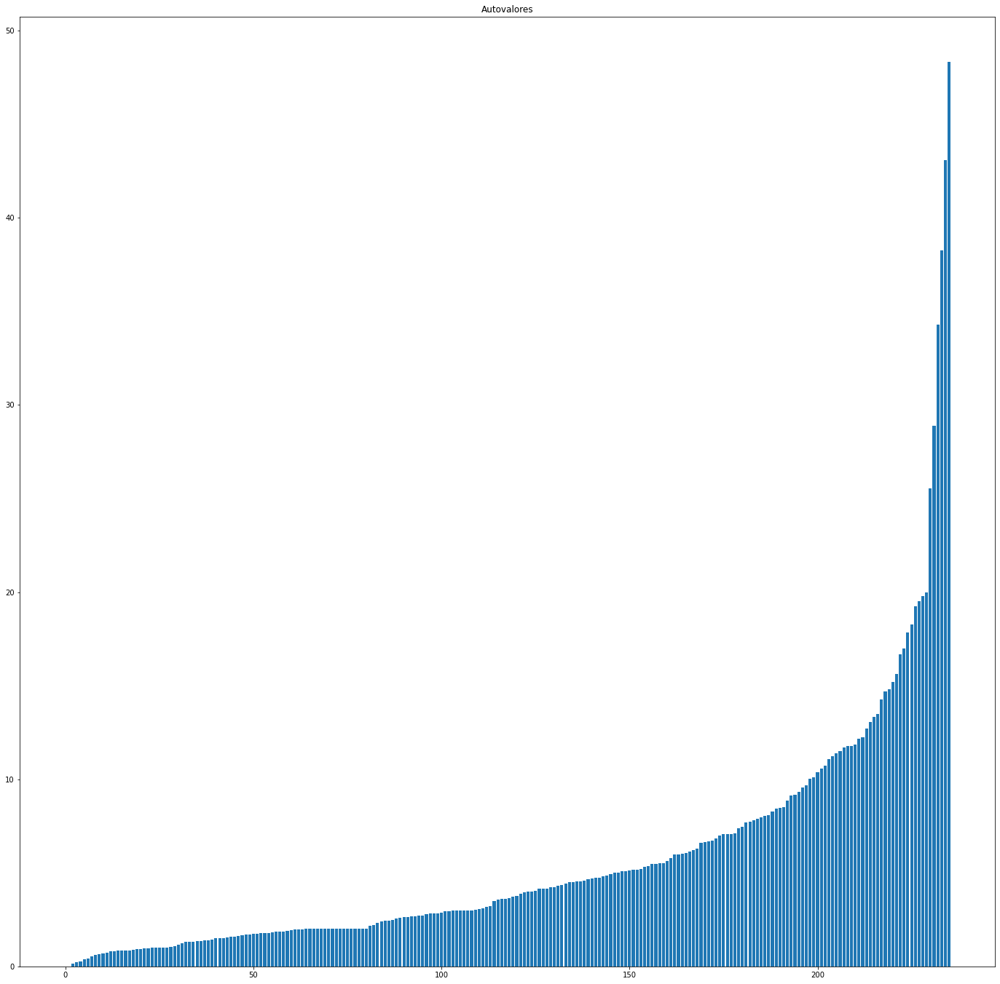

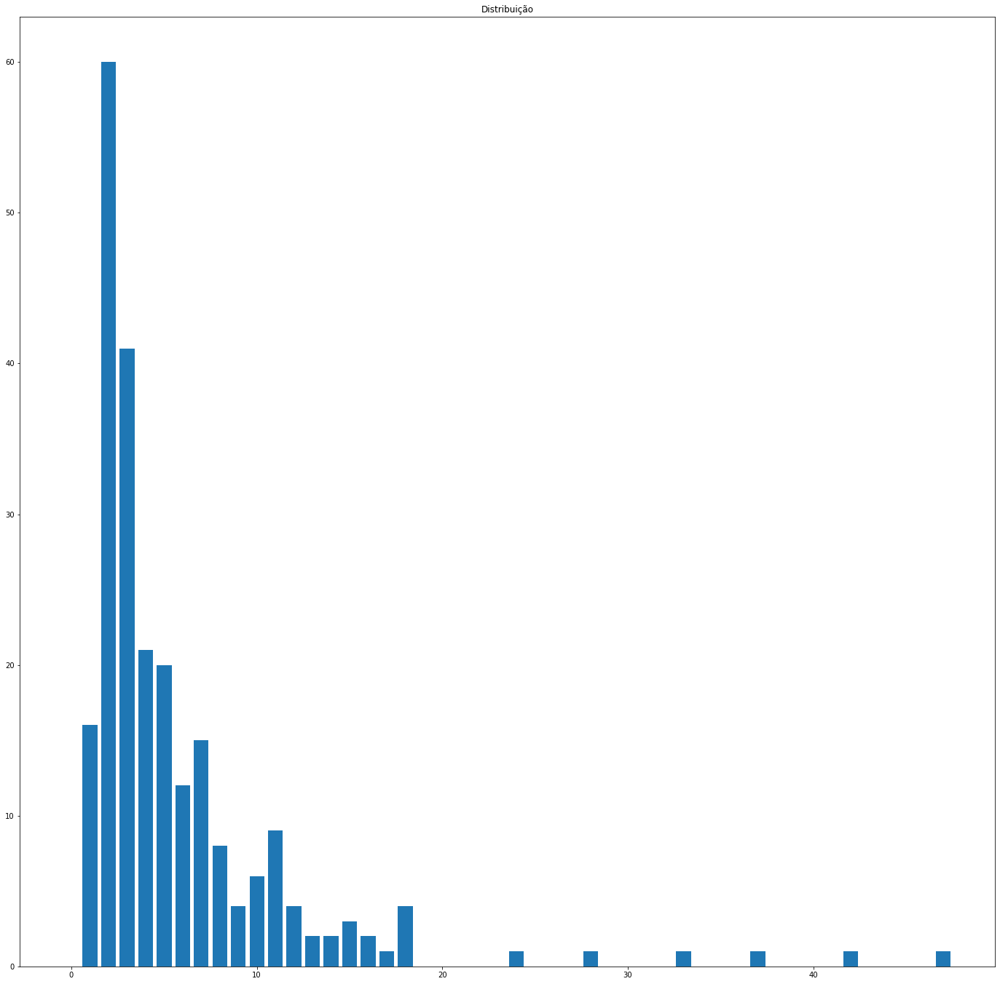

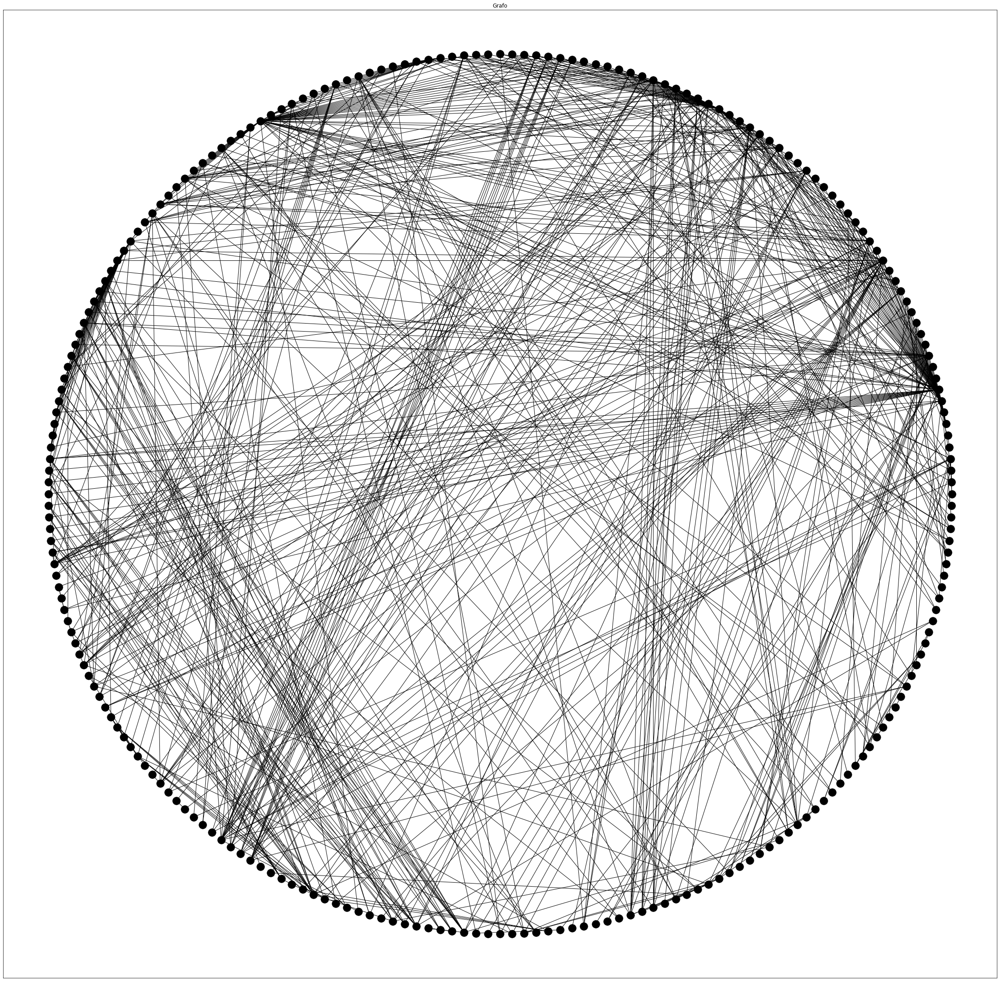

to\BoaVista.xlsx


Indicadores
Densidade: 		 0.04237867395762133
Coef. Clusterização: 	 0.05470892743620016
Grau médio: 		 3.220779220779221
Grau Maximo: 		 13.0
Entropia: 		 -270.6965110154031
Assortatividade: 	 -0.10941582680104468

Graficos


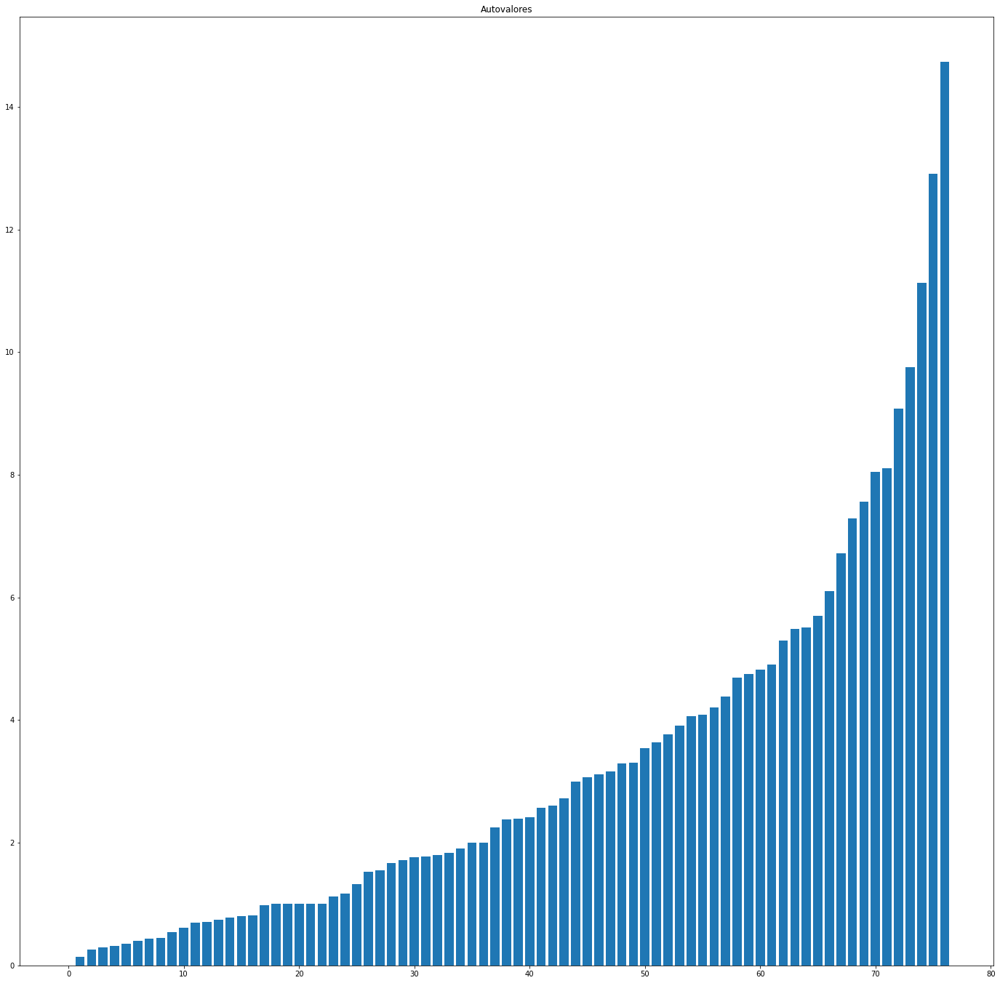

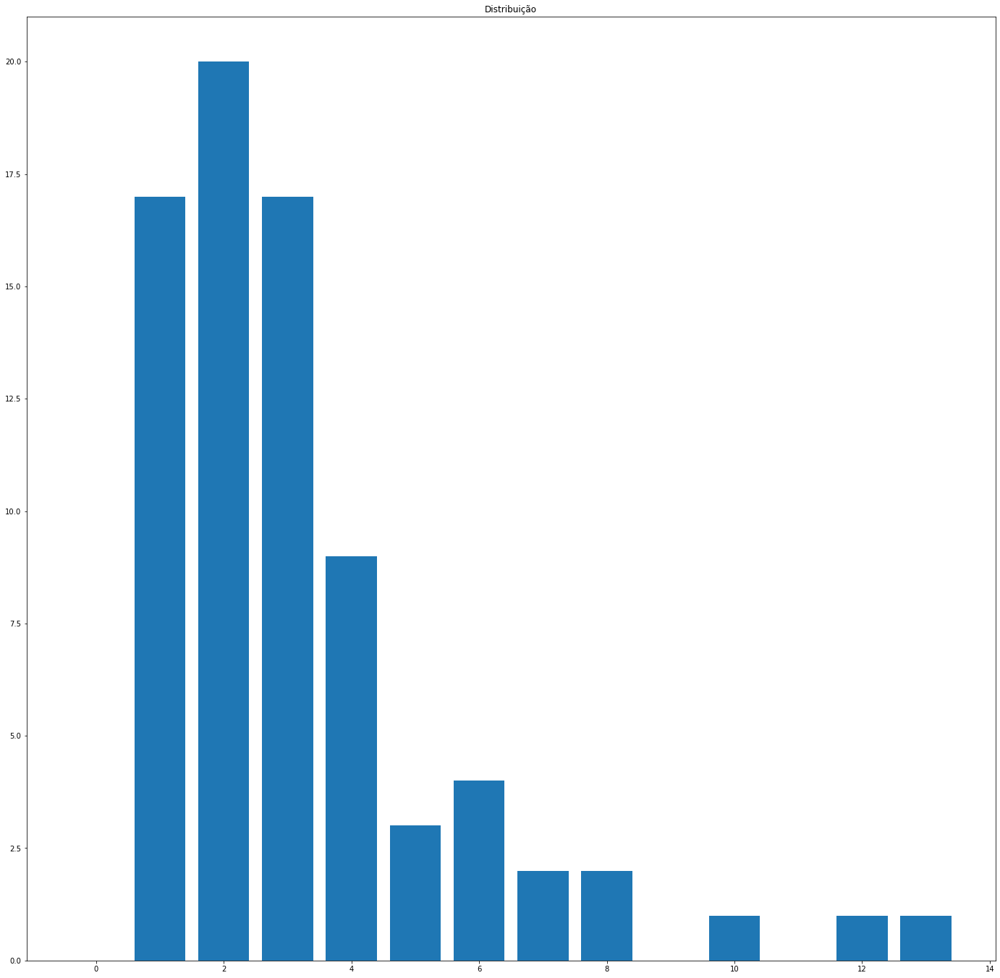

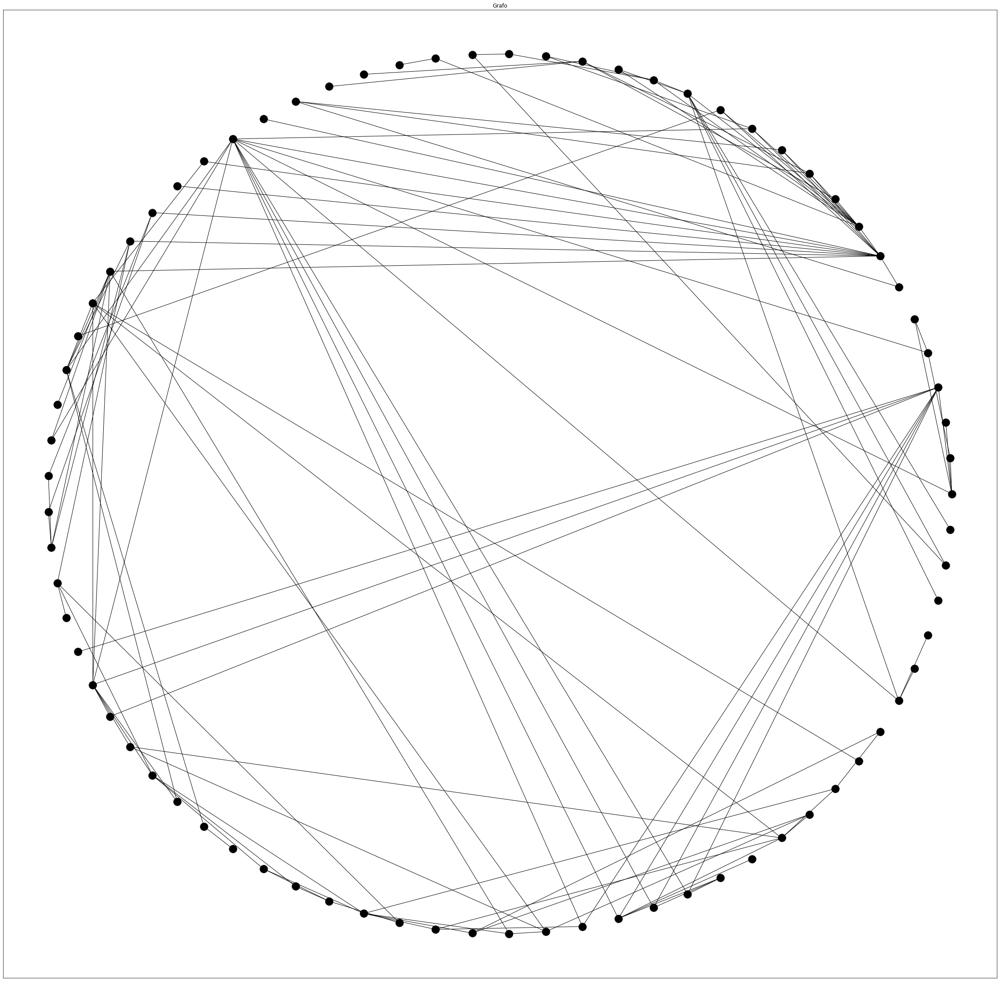

nto\Cabanga.xlsx


Indicadores
Densidade: 		 0.15
Coef. Clusterização: 	 0.0
Grau médio: 		 3.6
Grau Maximo: 		 10.0
Entropia: 		 -47.774437510817336
Assortatividade: 	 -0.22862658576944345

Graficos


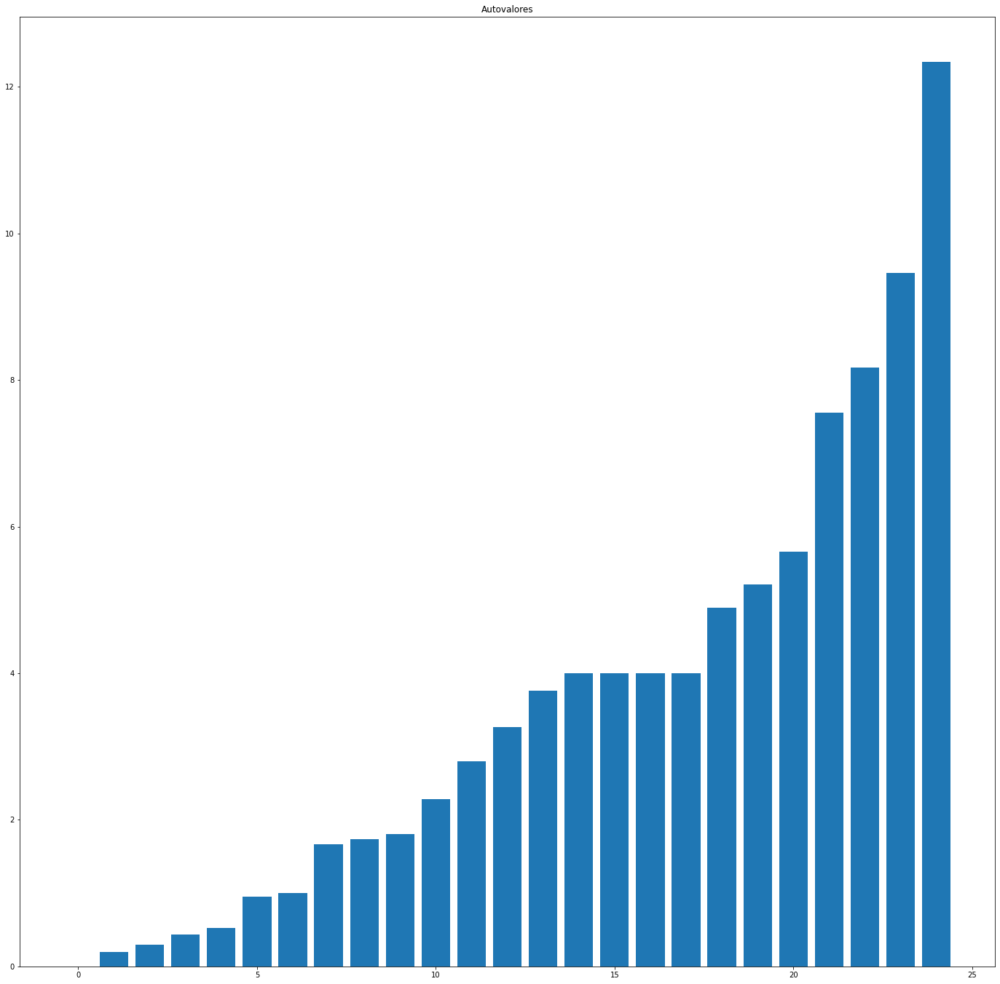

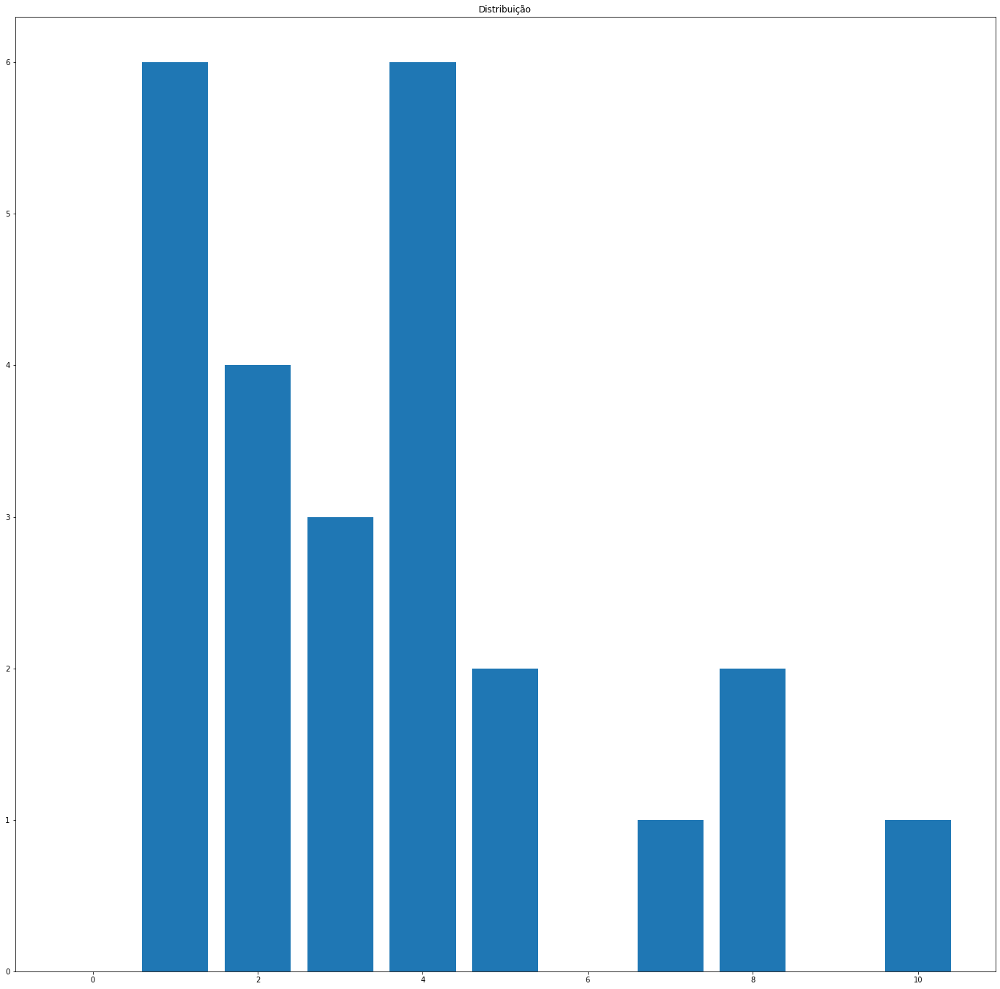

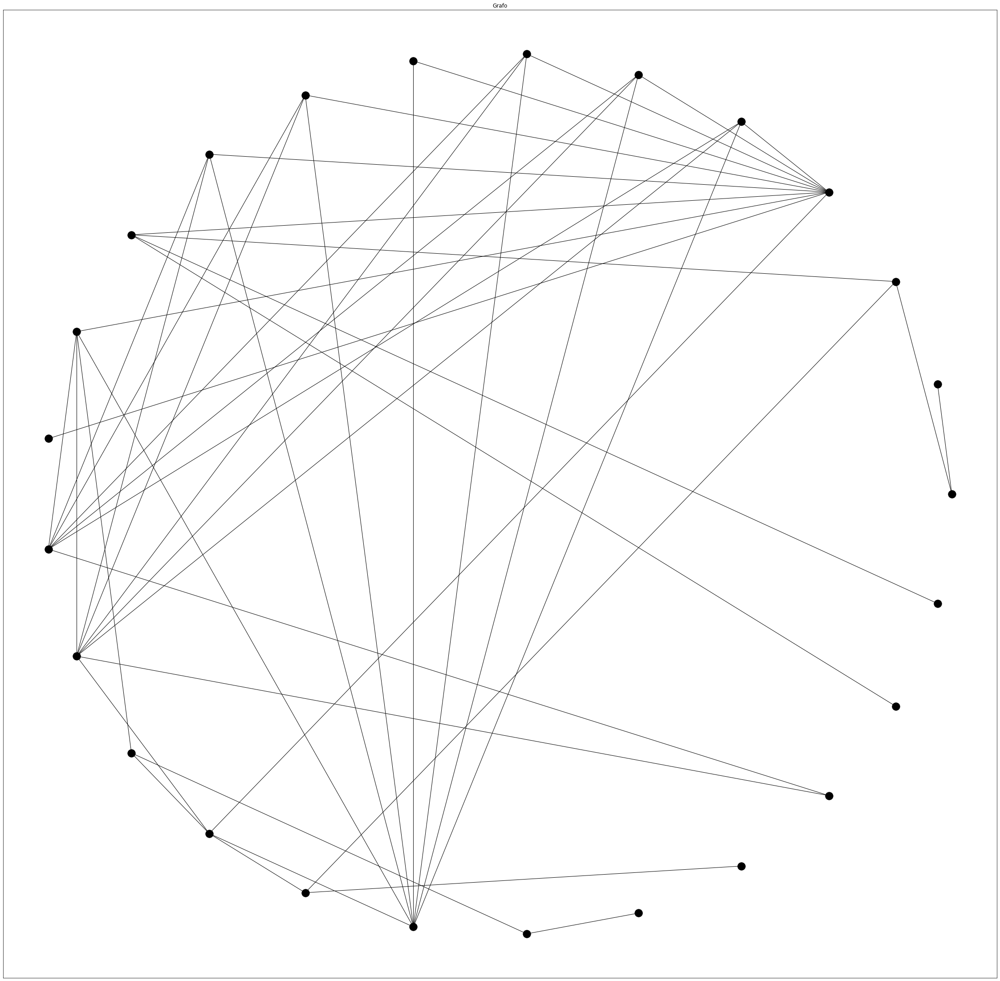

o\Paissandu.xlsx


Indicadores
Densidade: 		 0.13725490196078433
Coef. Clusterização: 	 0.1
Grau médio: 		 2.3333333333333335
Grau Maximo: 		 6.0
Entropia: 		 -38.01601243100351
Assortatividade: 	 -0.06358087487283845

Graficos


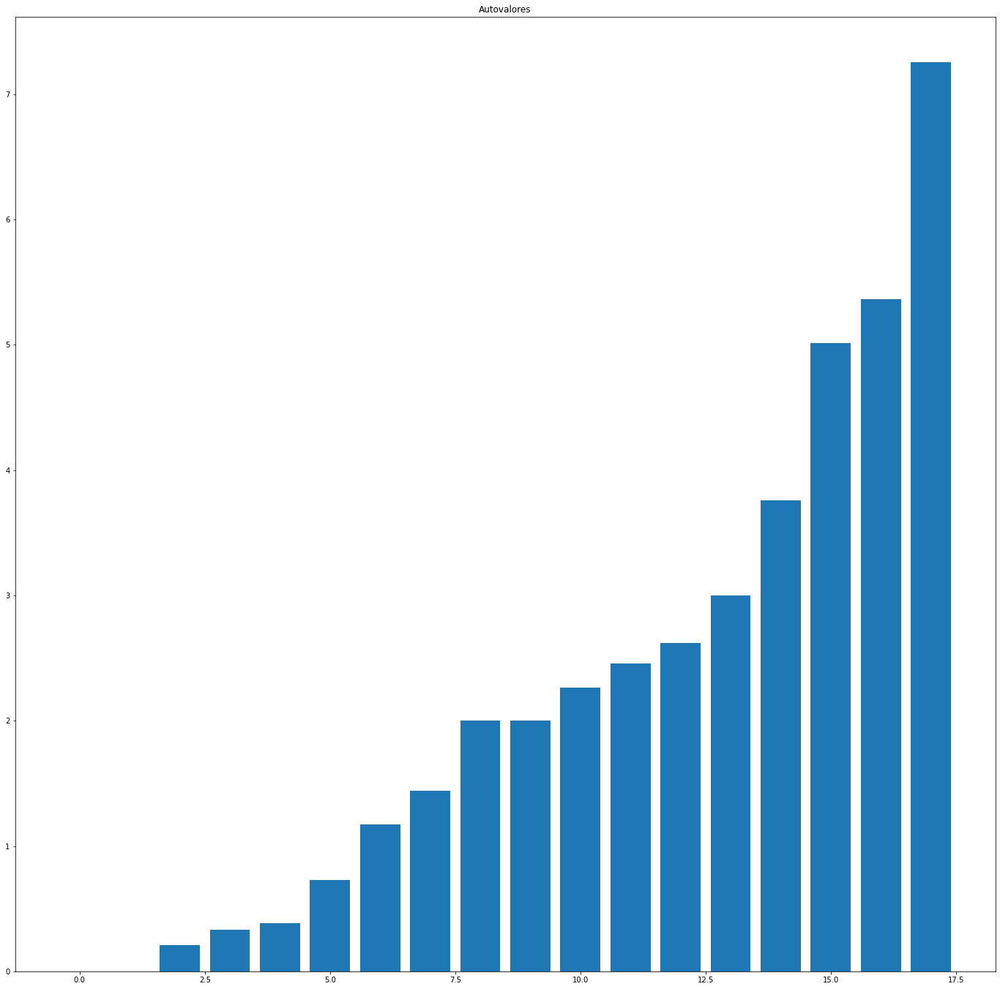

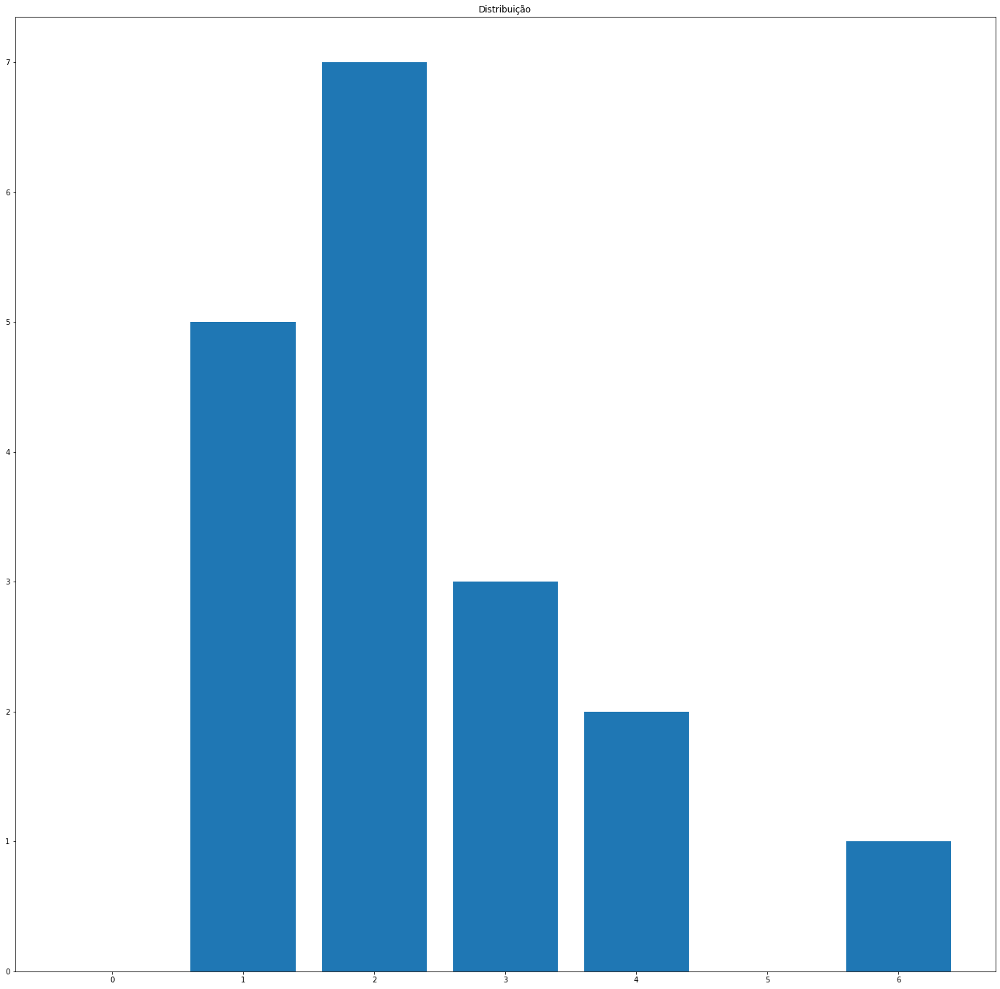

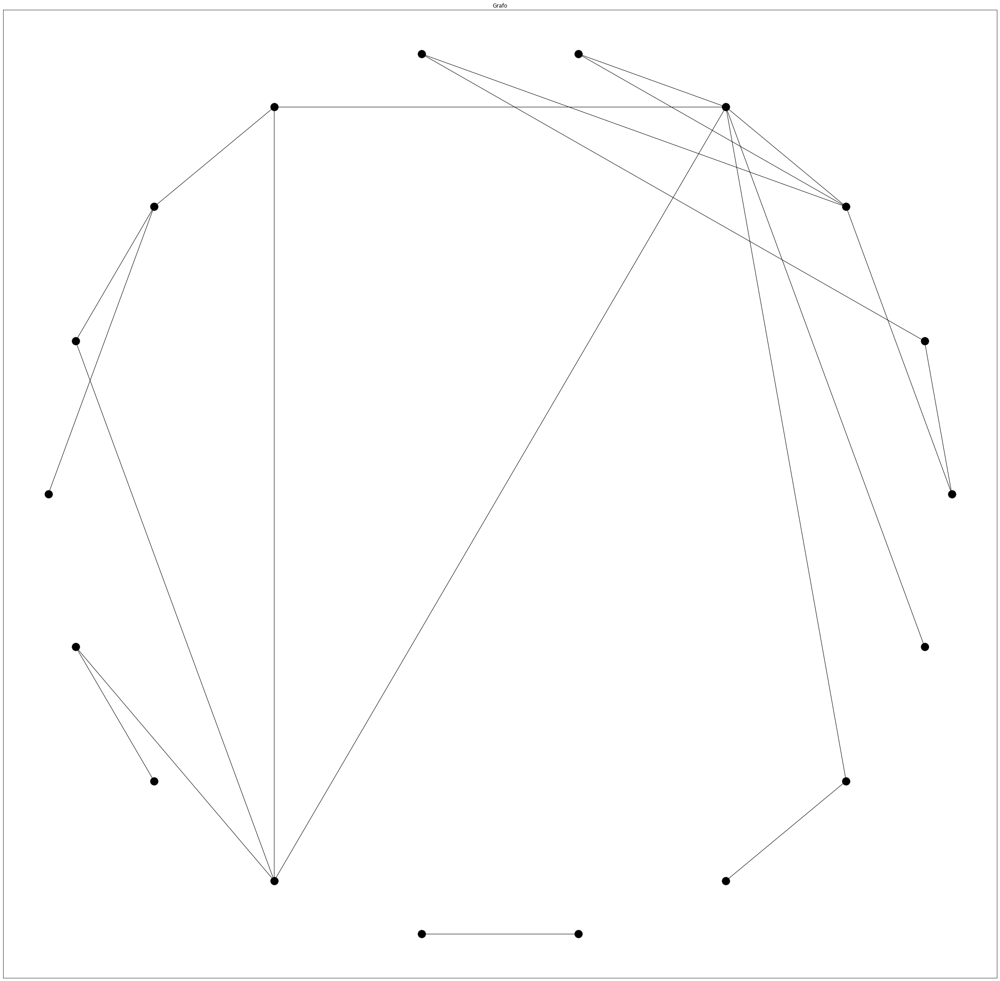

imento\Pina.xlsx


Indicadores
Densidade: 		 0.022027373823781008
Coef. Clusterização: 	 0.1376346032830995
Grau médio: 		 3.6785714285714284
Grau Maximo: 		 20.0
Entropia: 		 -746.6255616176916
Assortatividade: 	 -0.21179201210752427

Graficos


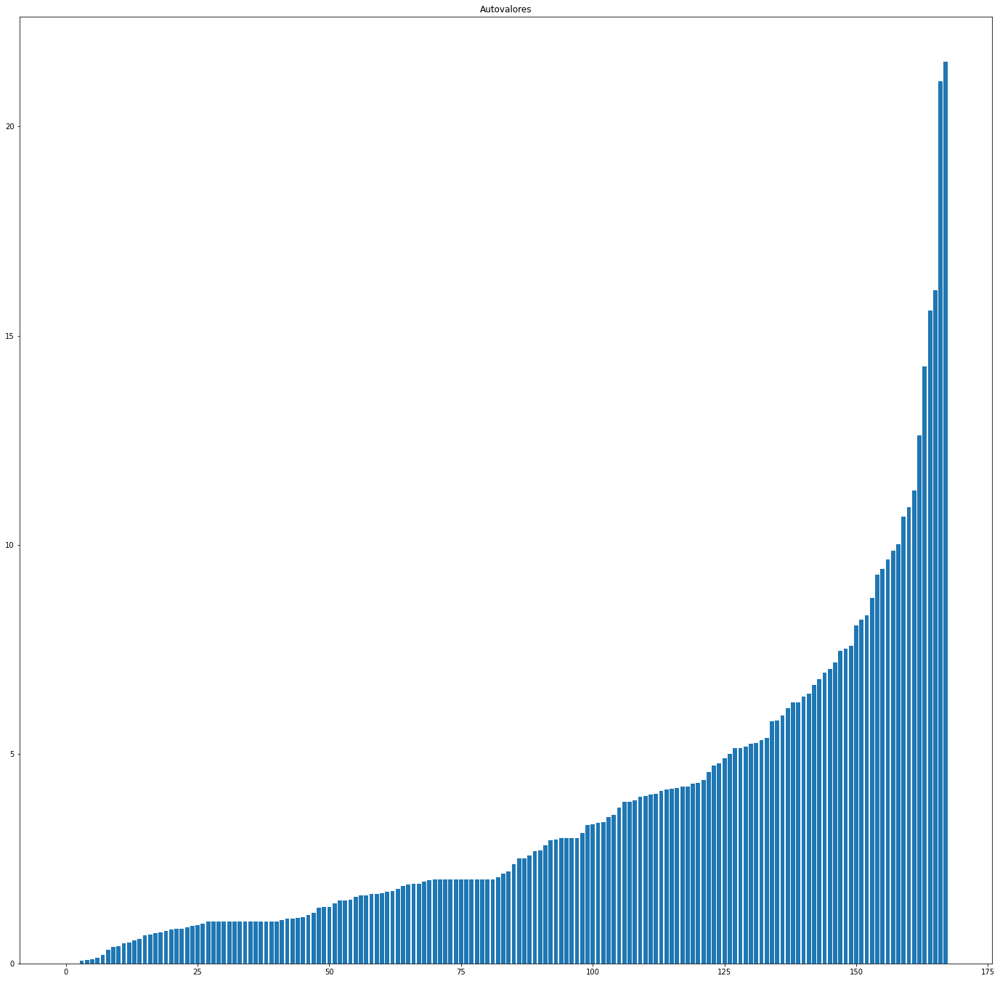

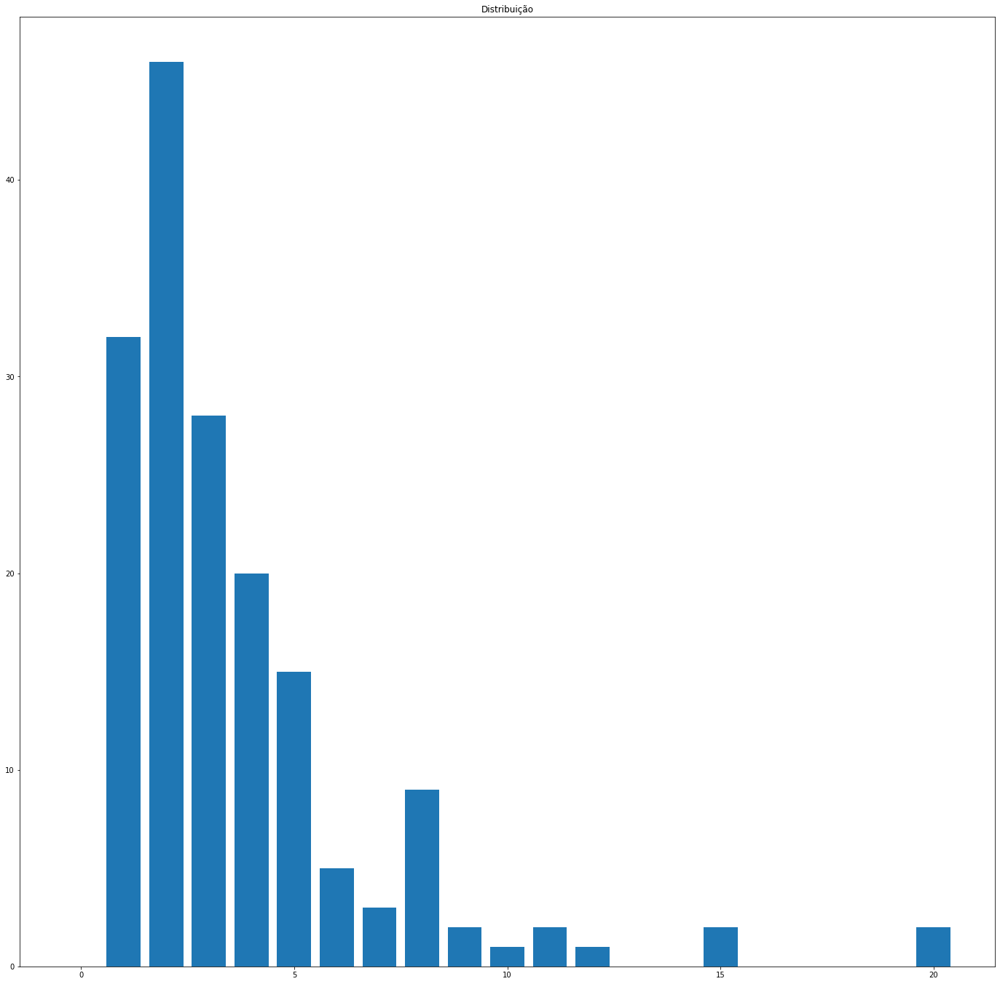

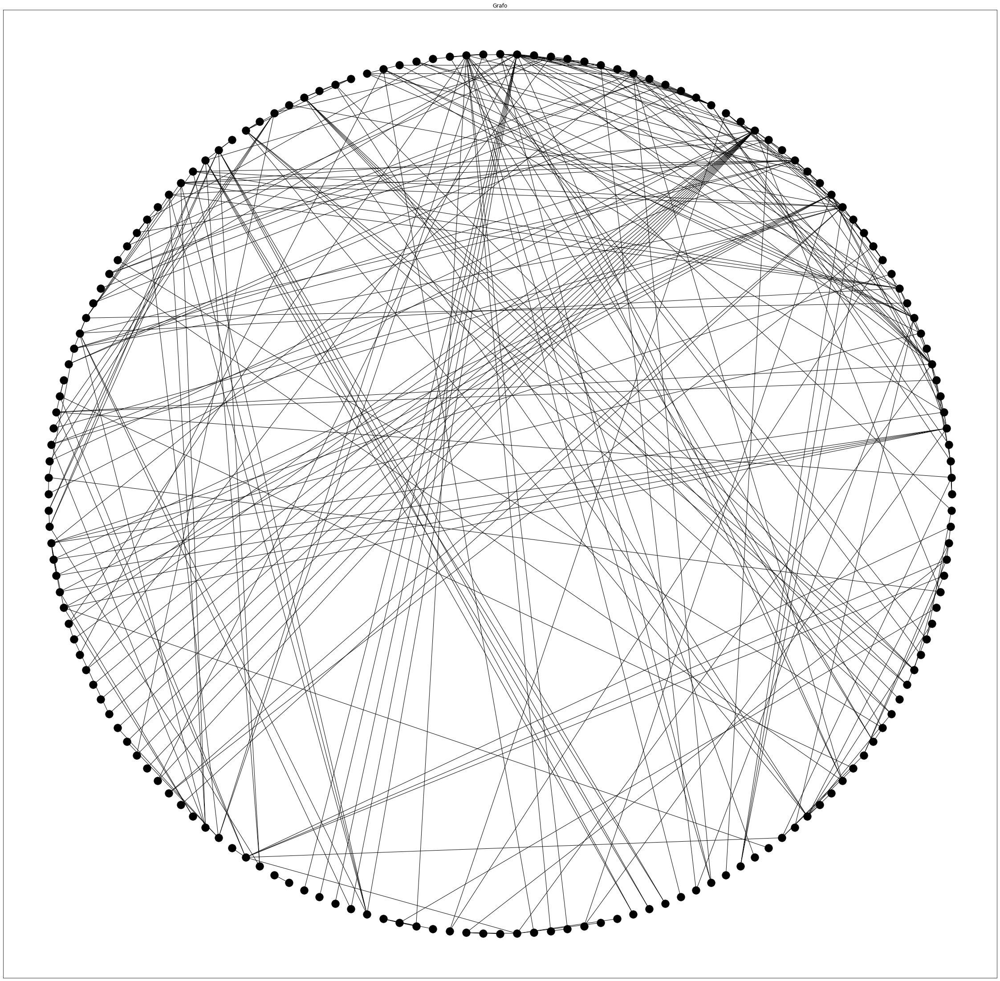

In [101]:
import os

AltoFluxo = r"C:\Users\usuario\OneDrive\Academico\UPE\IOT\Trabalho1\TrabalhoIOT\WebStreetPE\Dados\Dados Coletados\Alto Movimento"
caminhos = [os.path.join(AltoFluxo, nome) for nome in [s for s in os.listdir(AltoFluxo) if ".xlsx" in s]]

for i in caminhos:
    print(i[-16:])
    dfBairro = pd.read_excel(i, sheet_name="Final", usecols=[0,1,2])
    G = nx.Graph([(row['Rua 1'],row['Rua 2'])for index, row in dfBairro.iterrows()])
    
    plotIndicadoresGrafos(G)

ento\Jiquiá.xlsx


Indicadores
Densidade: 		 0.03398058252427184
Coef. Clusterização: 	 0.20060564435564437
Grau médio: 		 3.5
Grau Maximo: 		 16.0
Entropia: 		 -391.5480136724652
Assortatividade: 	 -0.08830515129474305

Graficos


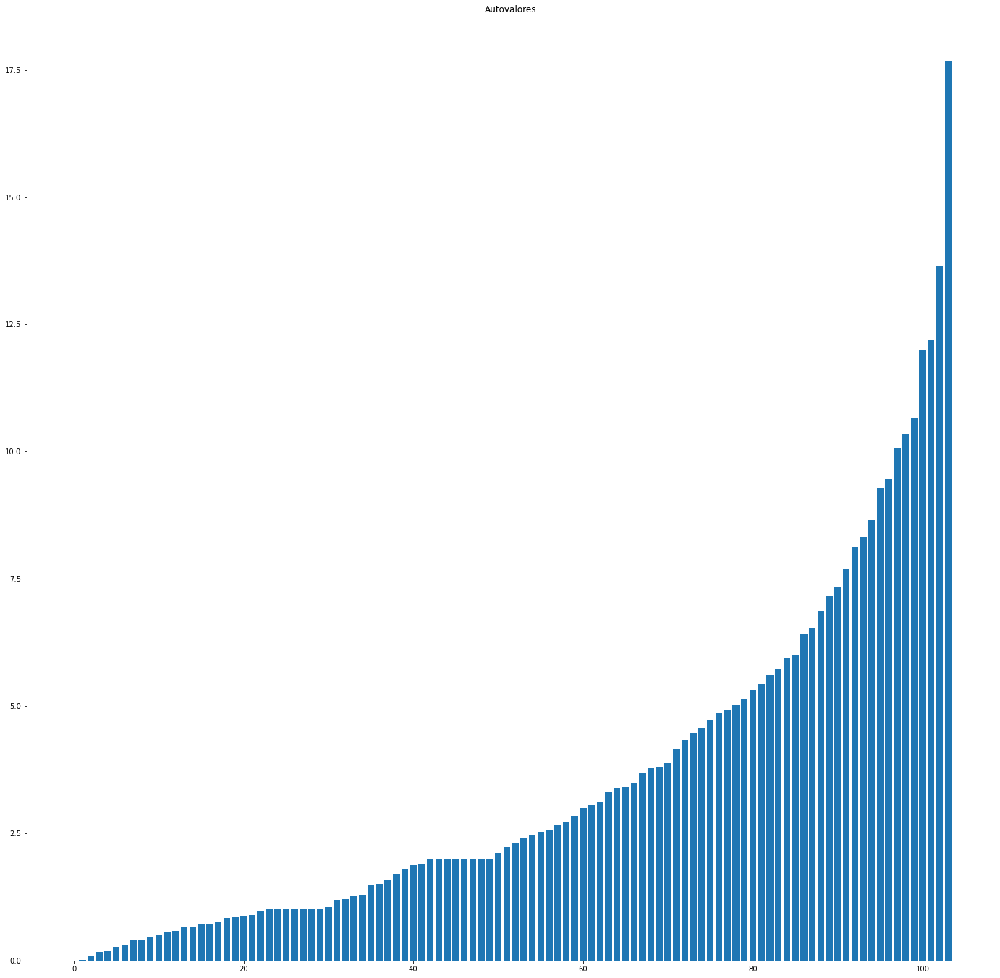

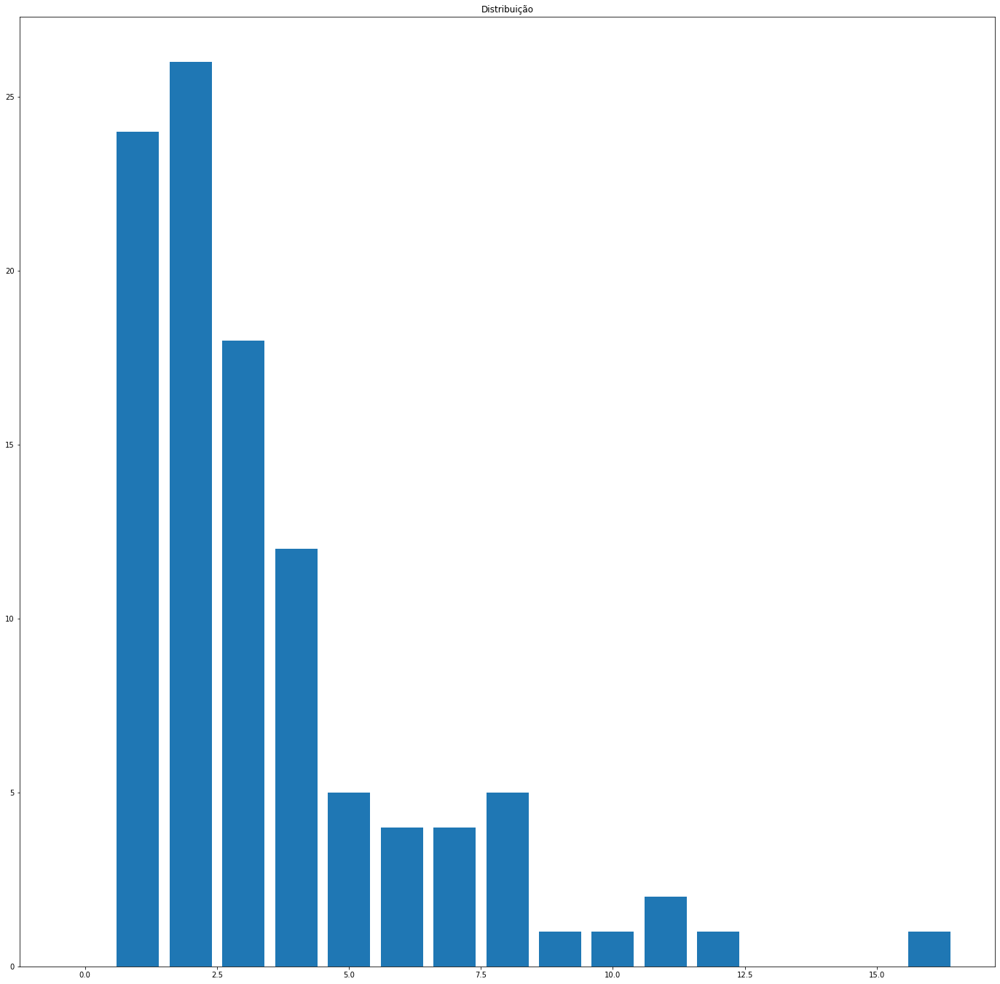

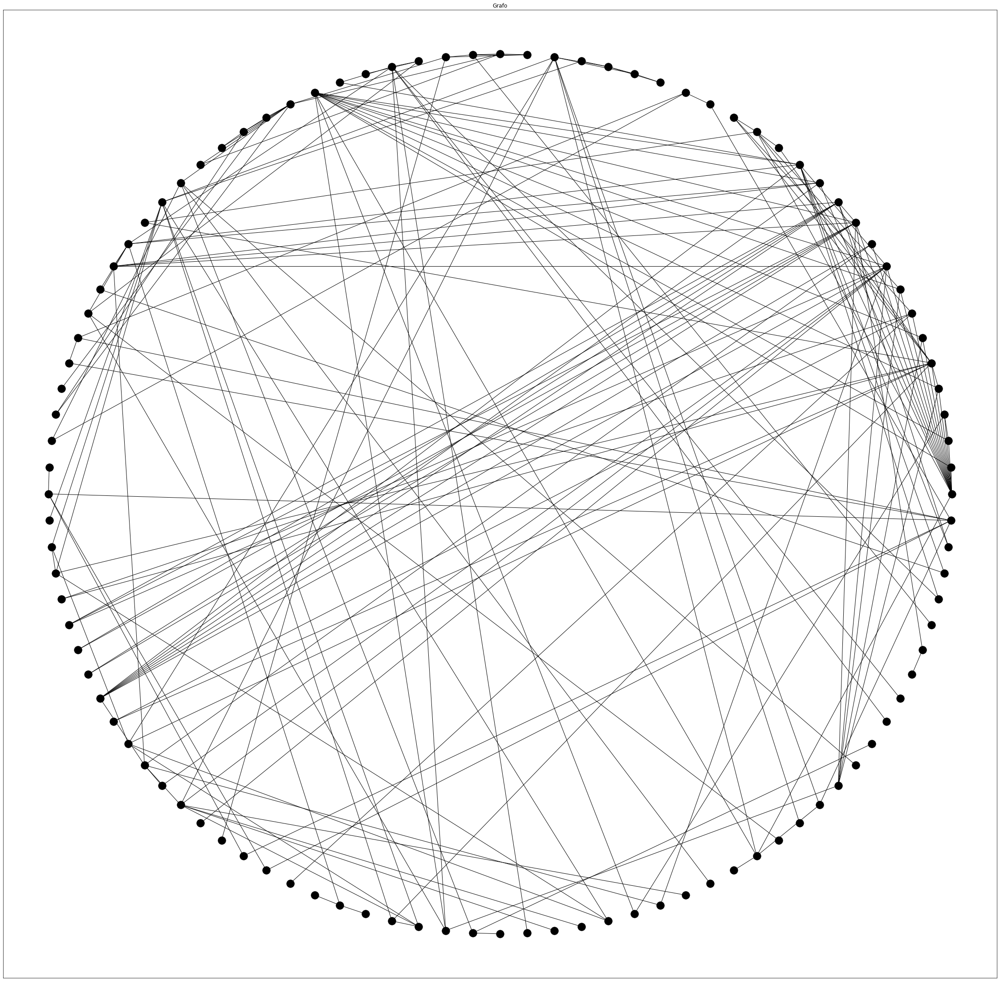

to\Monteiro.xlsx


Indicadores
Densidade: 		 0.08333333333333333
Coef. Clusterização: 	 0.14343434343434344
Grau médio: 		 2.6666666666666665
Grau Maximo: 		 8.0
Entropia: 		 -88.46011976157696
Assortatividade: 	 -0.31977342945417075

Graficos


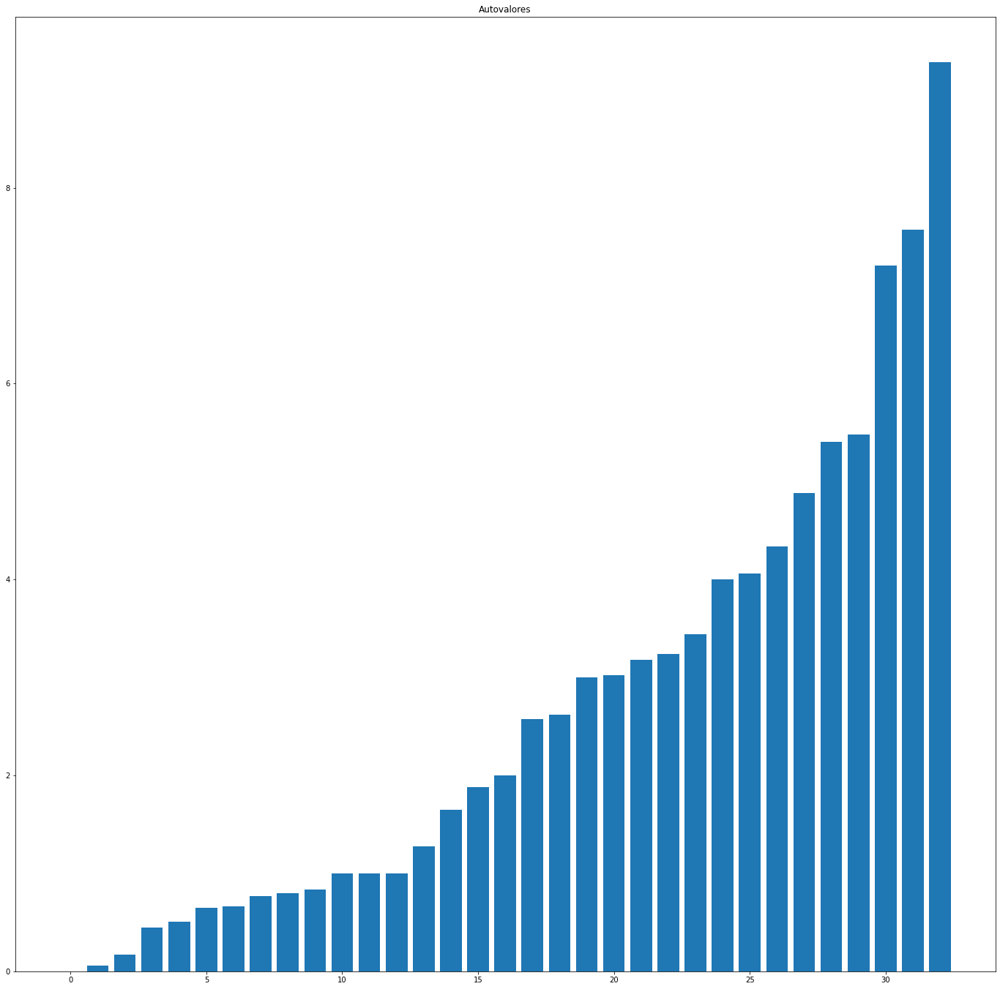

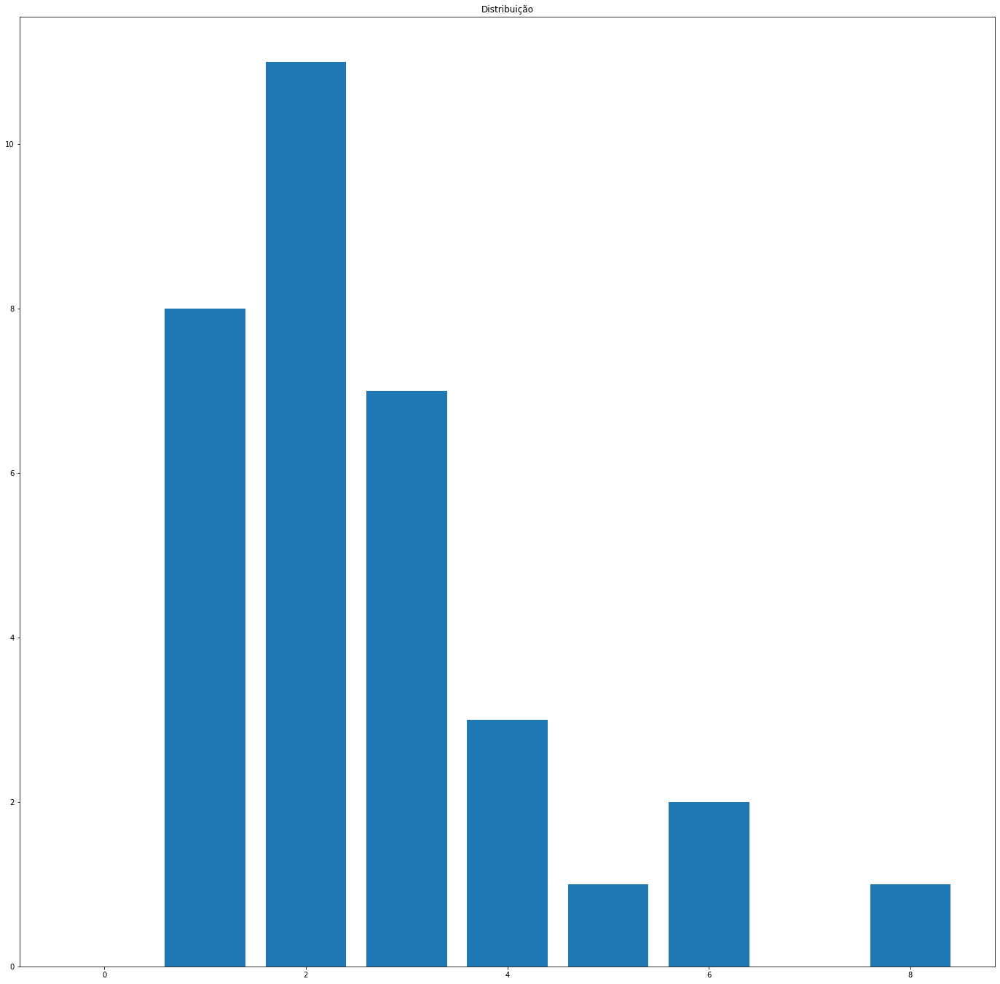

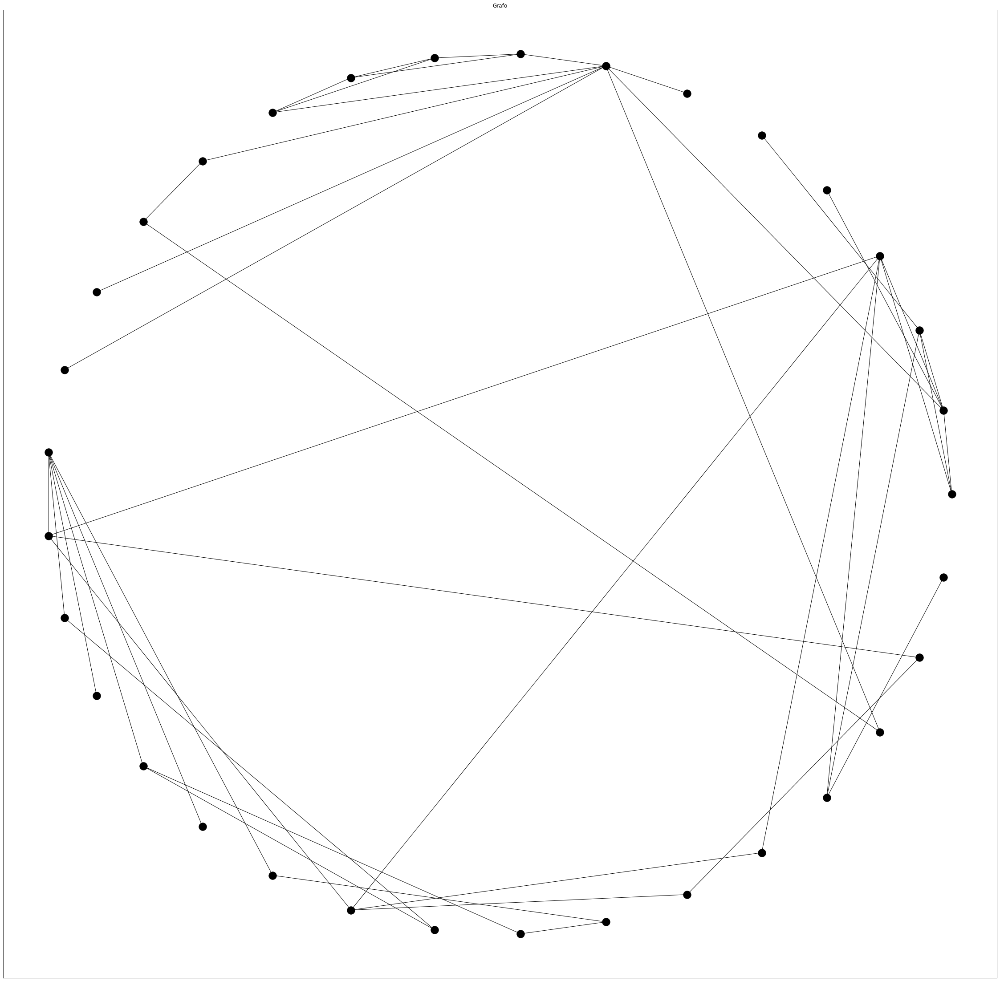

Tamarineira.xlsx


Indicadores
Densidade: 		 0.052429667519181586
Coef. Clusterização: 	 0.17429641296918189
Grau médio: 		 3.5652173913043477
Grau Maximo: 		 20.0
Entropia: 		 -230.357650682533
Assortatividade: 	 -0.1118024416494623

Graficos


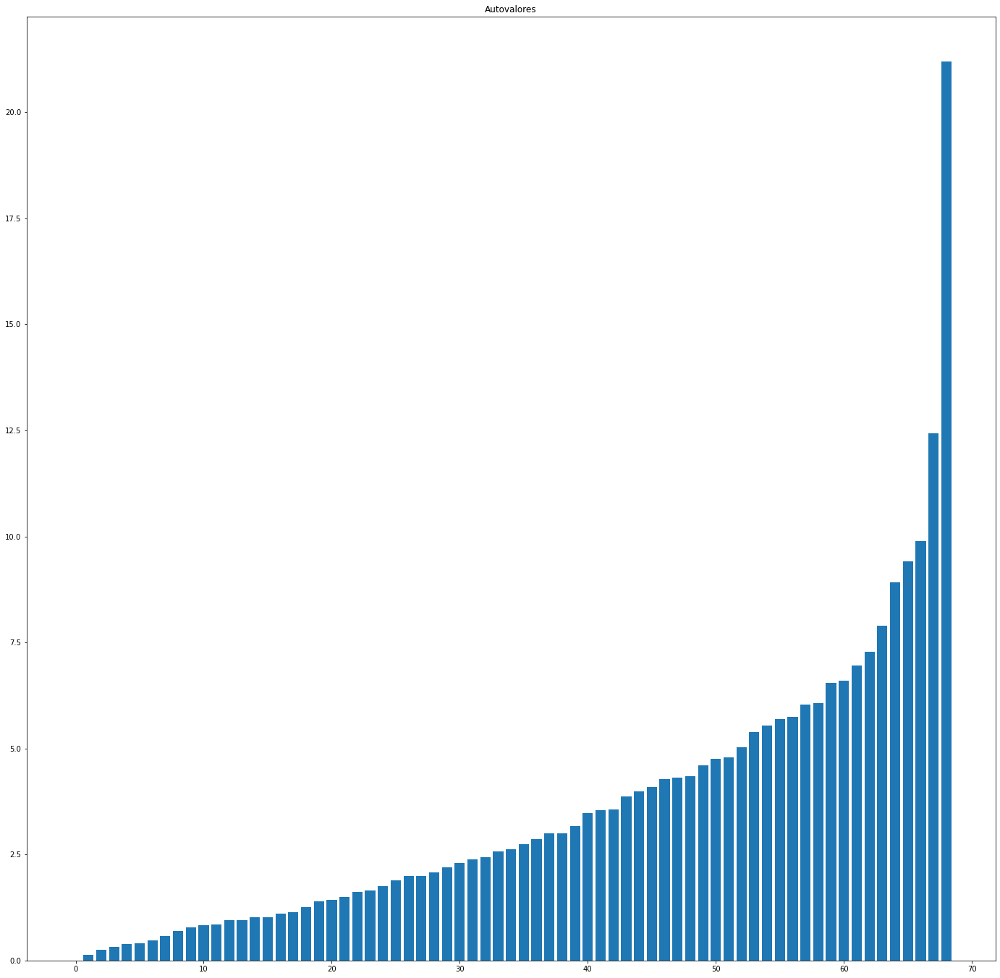

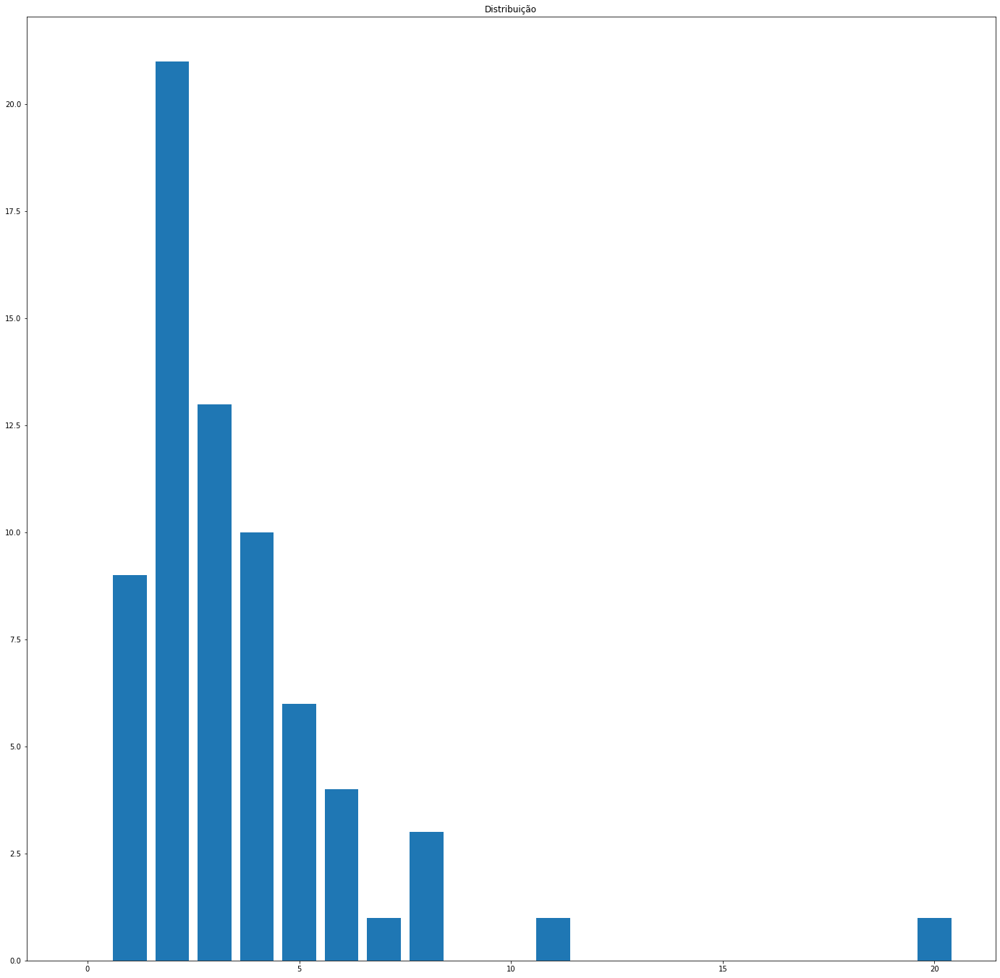

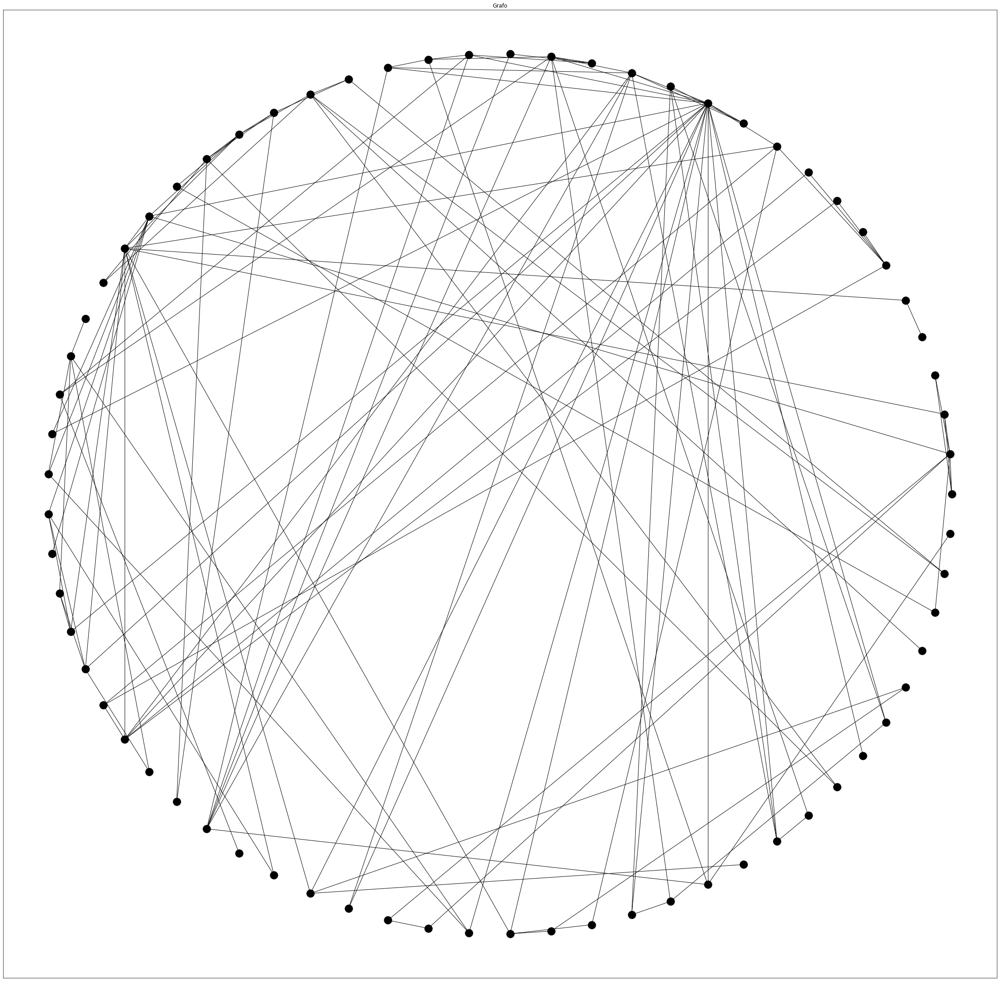

nto\Tejipio.xlsx


Indicadores
Densidade: 		 0.04326923076923077
Coef. Clusterização: 	 0.153040293040293
Grau médio: 		 2.769230769230769
Grau Maximo: 		 10.0
Entropia: 		 -229.86913825149963
Assortatividade: 	 -0.0036452004860272657

Graficos


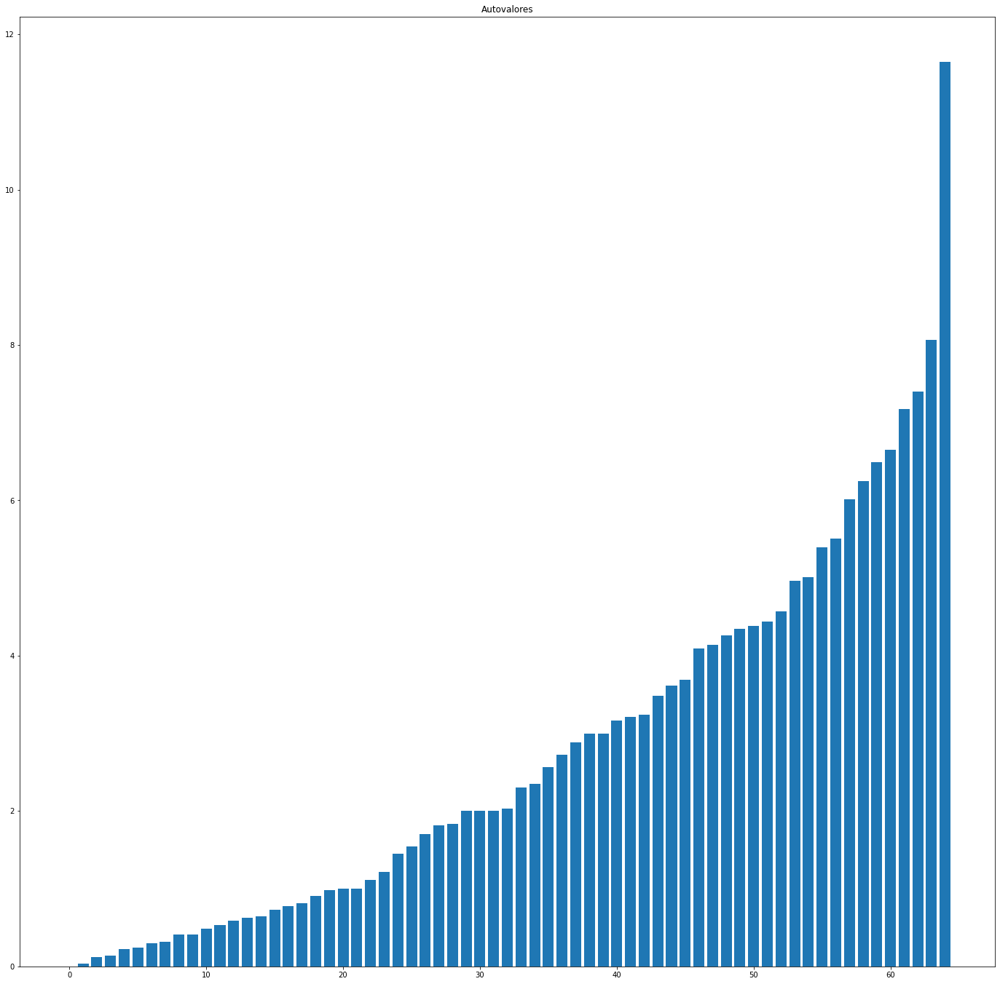

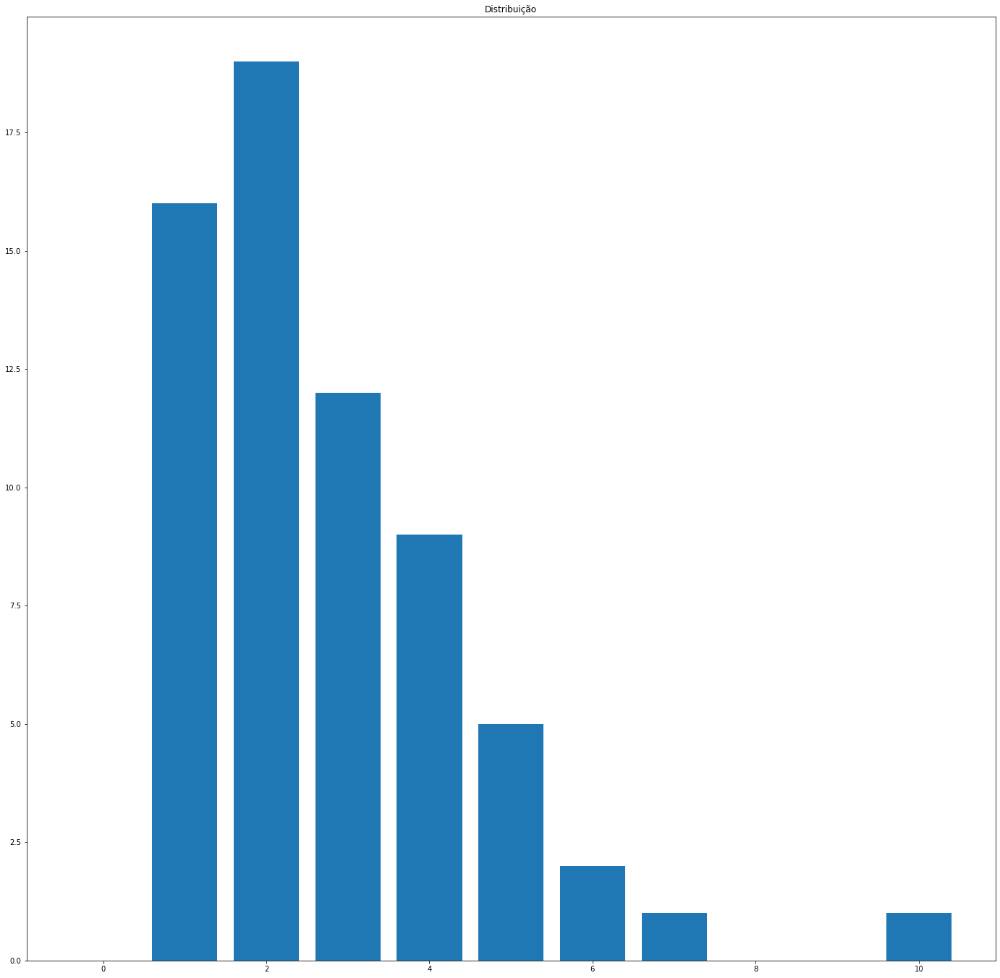

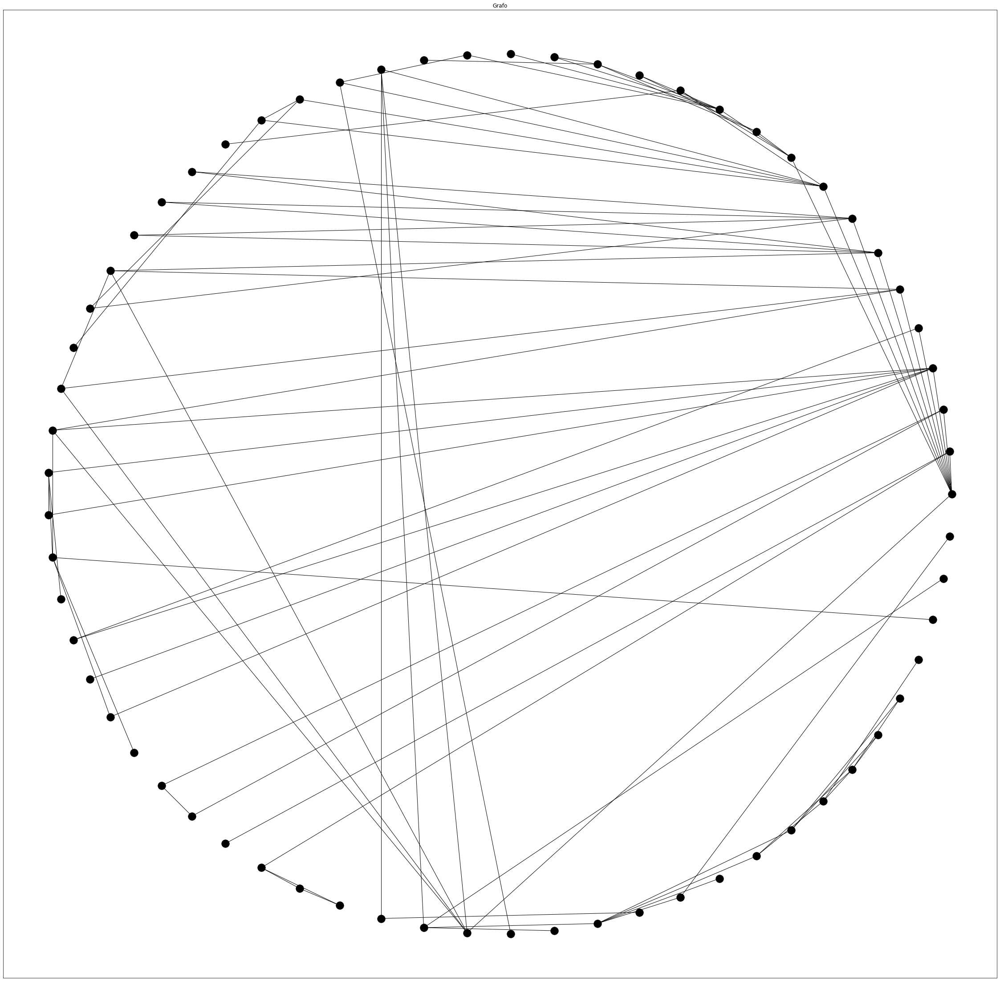

imento\Toto.xlsx


Indicadores
Densidade: 		 0.16666666666666666
Coef. Clusterização: 	 0.126984126984127
Grau médio: 		 3.3333333333333335
Grau Maximo: 		 6.0
Entropia: 		 -43.91614696089363
Assortatividade: 	 -0.03433289873968014

Graficos


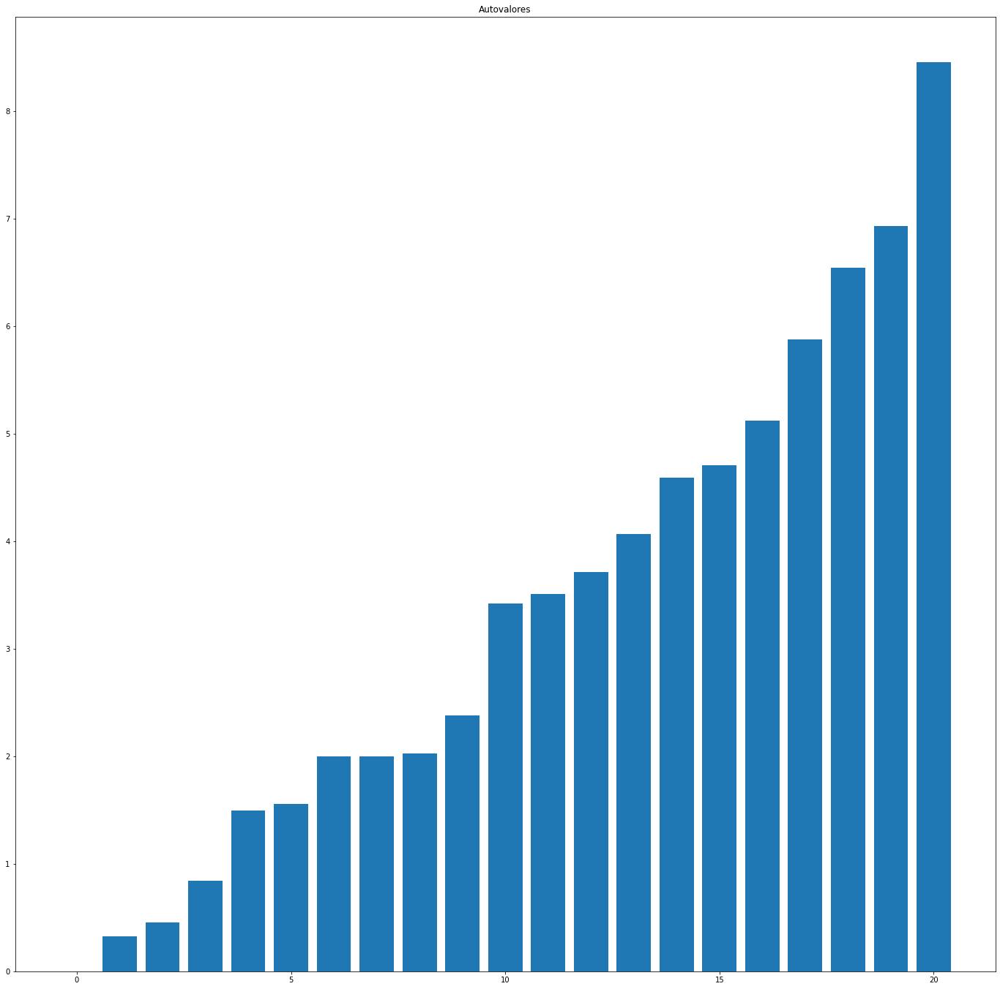

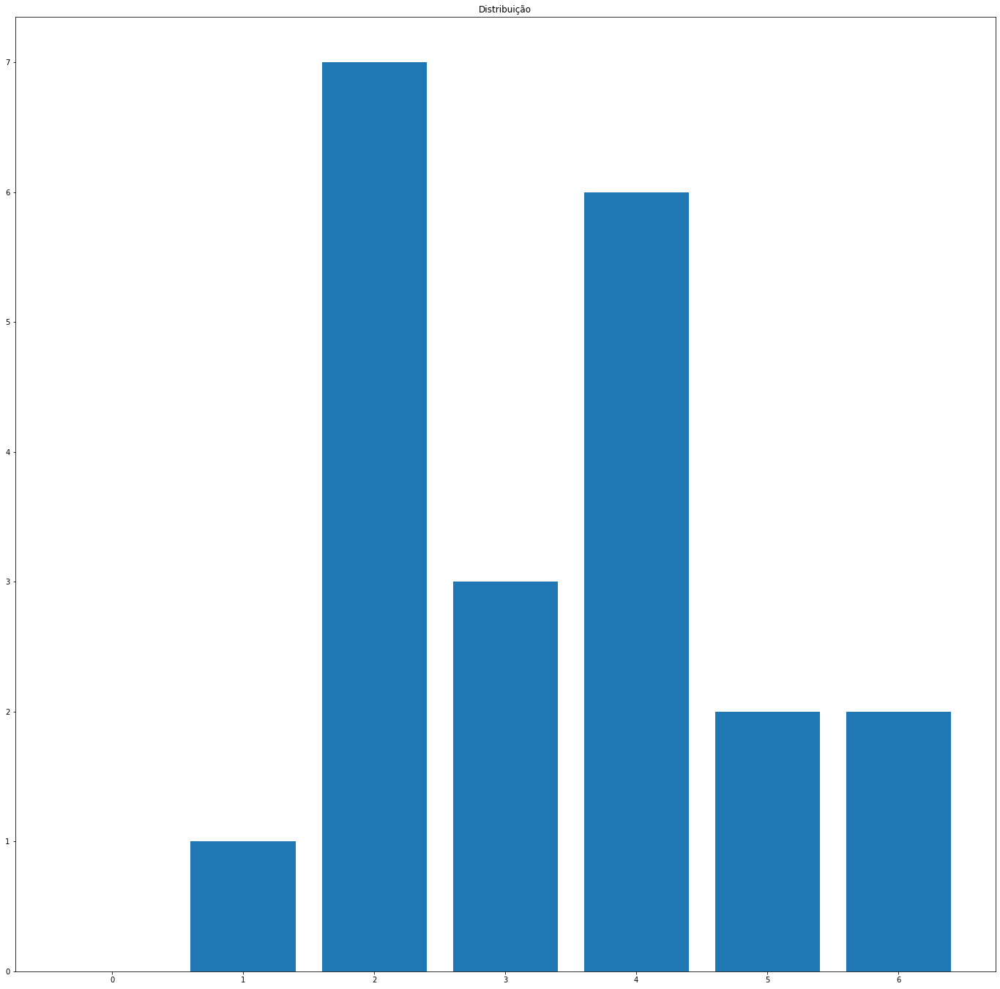

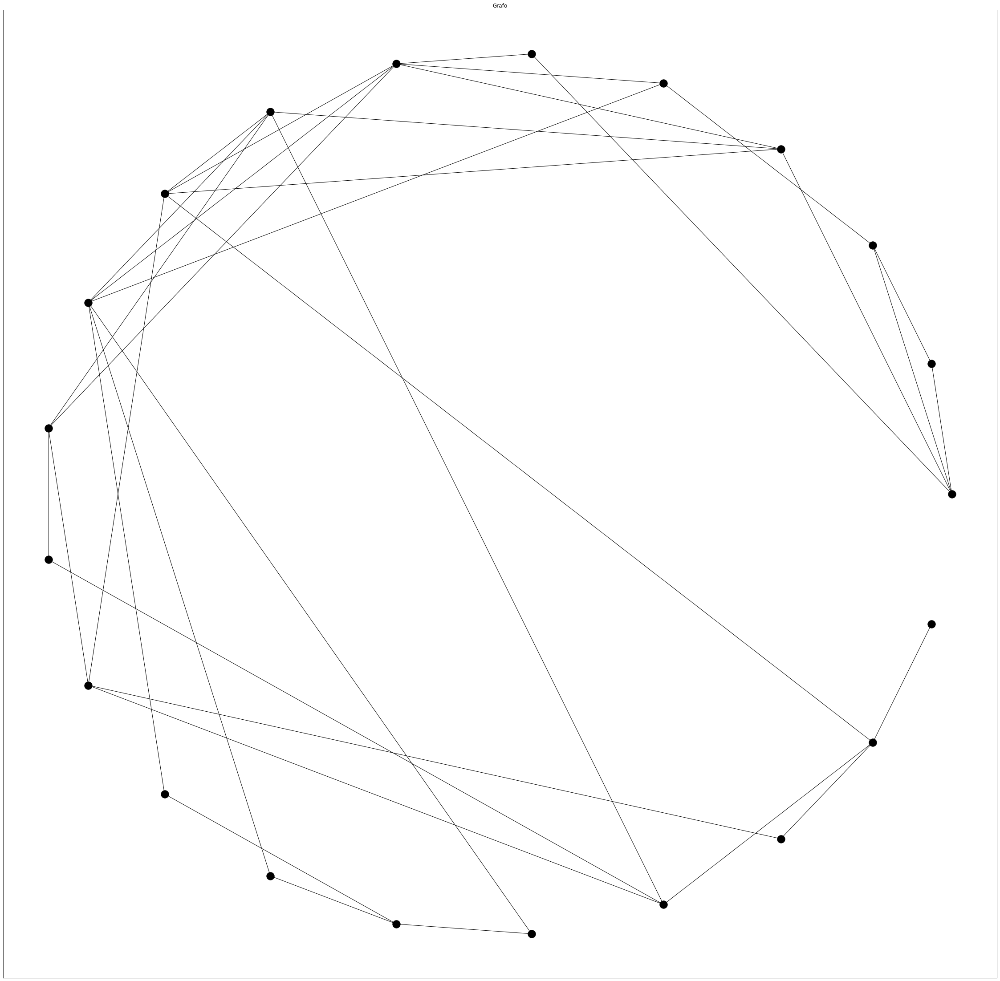

In [93]:
import os

BaixoFluxo = r"C:\Users\usuario\OneDrive\Academico\UPE\IOT\Trabalho1\TrabalhoIOT\WebStreetPE\Dados\Dados Coletados\Baixo Movimento"
caminhos = [os.path.join(BaixoFluxo, nome) for nome in os.listdir(BaixoFluxo)]

for i in caminhos:
    print(i[-16:])
    dfBairro = pd.read_excel(i, sheet_name="Final", usecols=[0,1,2])
    G = nx.Graph([(row['Rua 1'],row['Rua 2'])for index, row in dfBairro.iterrows()])

    plotIndicadoresGrafos(G)

In [147]:
head5 = dfMergeSensorEquip[["Bairros","Fluxo"]].groupby("Bairros").sum('Fluxo').sort_values('Fluxo').reset_index().head()
tail5 = dfMergeSensorEquip[["Bairros","Fluxo"]].groupby("Bairros").sum('Fluxo').sort_values('Fluxo').reset_index().tail()

In [152]:
topsConcat = pd.concat([tail5,head5])

In [153]:
topsConcat

,Bairros,Fluxo
22,Boa Vista,1534136.00
23,Paissandu,1583796.00
24,Cabanga,2178439.00
25,Boa Viagem,4162174.00
26,Pina,4374506.00
0,Monteiro,30677.00
1,Totó,114229.00
2,Tejipió,232432.00
3,Jiquiá,271431.00
4,Tamarineira,279190.00


In [173]:
topsConcat["Centralidade Med"] = [3.22077, 2.33333,3.6, 5.75423, 3.67857, 2.66666, 3.33333, 2.76923, 3.5, 3.56521]

In [174]:
topsConcat["Centralidade Max"] = [13, 6, 10, 47, 20, 8, 6, 10 , 16, 20]


In [175]:
topsConcat

,Bairros,Fluxo,Centralidade,Centralidade Max,Centralidade Med
22,Boa Vista,1534136.00,3.22,13,3.22
23,Paissandu,1583796.00,2.33,6,2.33
24,Cabanga,2178439.00,3.60,10,3.60
25,Boa Viagem,4162174.00,5.75,47,5.75
26,Pina,4374506.00,3.68,20,3.68
0,Monteiro,30677.00,2.67,8,2.67
1,Totó,114229.00,3.33,6,3.33
2,Tejipió,232432.00,2.77,10,2.77
3,Jiquiá,271431.00,3.50,16,3.50
4,Tamarineira,279190.00,3.57,20,3.57


In [176]:
topsConcat.corr()

,Fluxo,Centralidade,Centralidade Max,Centralidade Med
Fluxo,1.00,0.63,0.65,0.63
Centralidade,0.63,1.00,0.93,1.00
Centralidade Max,0.65,0.93,1.00,0.93
Centralidade Med,0.63,1.00,0.93,1.00


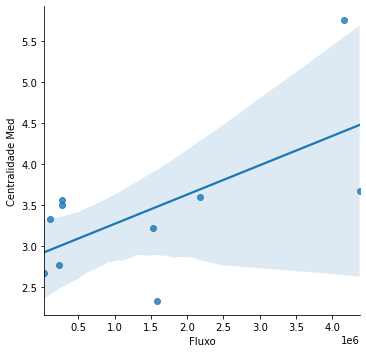

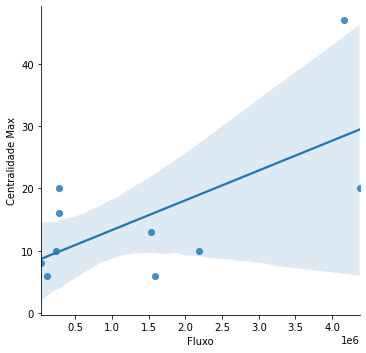

In [177]:
sns.lmplot(x='Fluxo', y='Centralidade Med', data=topsConcat)
sns.lmplot(x='Fluxo', y='Centralidade Max', data=topsConcat)